# BINA Case Study - Standortanalyse Halt AG

## Welche Schweizer Stadt ist für junge Fachkräfte am attraktivsten?

---
### Management Summary
**Modul:** BINA - Business Intelligence & Analytics  
**Framework:** CPA From Data to Decisions  
**Städte im Vergleich:** Zürich · Bern · Basel · Lausanne · Genf · St. Gallen  
**Datenquelle:** Bundesamt für Statistik (BFS) - City Statistics  / MeteoSchweiz

---

## Inhaltsverzeichnis
1. [Einleitung](#Einleitung)
2. [Schritt 1: Ziele & Informationsbedarf](#schritt-1)
3. [Schritt 2: Daten laden & bereinigen](#schritt-2)
4. [Schritt 3: Analyse & Visualisierung](#schritt-3)
5. [Schritt 3b: Prognose 2024–2026](#schritt-3b)
6. [Schritt 4: Attraktivitätsindex & Entscheidung](#schritt-4)
7. [Anhang: Geo-Mapping & Choropleth-Karten](#anhang)

## Einleitung



Der Schweizer Arbeitsmarkt hat sich in den letzten Jahren stark verändert. Während in den Jahren nach der Pandemie ein ausgeprägter Fachkräftemangel viele Branchen unter Druck setzte, offenbart sich mittlerweile eine differenzierte Entwicklung. Nach dem Fachkräftemangel-Index Schweiz der Universität Zürich ist der Fachkräftemangel in der Schweiz in den letzten zwei Jahren stark zurückgegangen ([UZH, 2025](https://www.stellenmarktmonitor.uzh.ch/de/indices/fachkraeftemangel.html)).  Nichtsdestotrotz bleiben Fachkräfte im Gesundheits-, Bau- und Technikbereich gefragt, während die Nachfrage in Büro-. ICT- und Finanzberufen rückläufig ist. Parallel dazu verändern sich die Erwartungen junger Fachkräfte an ihren zukünftigen Arbeits- und Wohnort. Klassische Faktoren wie Lohn oder Karrieremöglichkeiten werden durch Aspekte wie Lebensqualität, Wohnkosten, Freizeitangebote oder Mobilität und gewinnen zunehmend an Bedeutung. Junge Arbeitnehmende der Generation Z achten bei der Wahl ihres Arbeitsortes stärker auf Work-Life-Balance, Flexibilität und Lebensqualität als frühere Generationen ([Deliotte, 2025](https://www.deloitte.com/ch/en/about/press-room/gen-z-millennial-survey-2025.html)).  


Für Unternehmen stellt sich diesbezüglich zunehmend die Frage, welche Schweizer Standorte besonders attraktiv für junge Fachkräfte sind und welche Standortfaktoren diese Attraktivität beeinflussen.

Im Rahmen dieser Arbeit wird auf Basis der Ausgangslage untersucht, welche Schweizer Städte für junge Fachkräfte besonders attraktiv sind.









## Setup & Imports

Die benötigten Bibliotheken werden für die Analyse importiert. "pandas" und "numpy" für die Datenverarbeitung, "matplotlib" und "seaborn" für die statistische Visualisierung sowie "geopandas" und "plotly" für die spätere räumliche Darstellung. Zusätzlich werden für eine konstante visuelle Identität der Städte eine spezifische Farbpalette definiert.

In [ ]:
# Bibliotheken installieren
# !pip install openpyxl plotly -q
# !pip install geopandas plotly -
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
from matplotlib.patches import FancyBboxPatch
import geopandas as gpd
import plotly.express as px
import zipfile, xml.etree.ElementTree as ET, re

# Plotting-Stil
plt.rcParams['figure.dpi'] = 130
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False

# Farbe pro Stadt (konsistent durch ganzes Notebook)
CITY_COLORS = {
    'Zürich':     '#1f77b4',
    'Bern':       '#ff7f0e',
    'Basel':      '#2ca02c',
    'Lausanne':   '#d62728',
    'Genf':       '#9467bd',
    'St. Gallen': '#8c564b',
}
CITIES = list(CITY_COLORS.keys())



---
<a id='schritt-1'></a>
## Schritt 1 – Ziele & Informationsbedarf
CPA Step 1: Identify the decision to be made and the information needs

### Geschäftlicher Kontext
Die Halt AG, ein fiktives Schweizer Unternehmen im Bereich technischer Dienstleistungen, steht vor einer strategischen Weichenstellung: Der bisherige Standort soll verlagert werden, um die Altersstruktur der Belegschaft gezielt zu verjüngen. Die Geschäftsleitung hat erkannt, dass die Gewinnung junger Fachkräfte zwischen 20 und 35 Jahren langfristig entscheidend für die Innovationsfähigkeit und Wettbewerbsposition des Unternehmens ist. Damit stellt sich die zentrale strategische Frage, welche Schweizer Stadt die attraktivsten Rahmenbedingungen bietet, um dieses Ziel zu erreichen. Die primäre Zielgruppe der Analyse ist die Geschäftsleitung der Halt AG. Als strategische Entscheidungsträger benötigen sie keine operativen Detaildaten, sondern eine kompakte, klar strukturierte Empfehlung, die auf vergleichbaren und nachvollziehbaren Indikatoren beruht. Die Informationsaufbereitung muss daher auf hoher Aggregationsstufe erfolgen und eine eindeutige Rangfolge der betrachteten Städte ermöglichen

### Herleitung des Attraktivitätsindex
Die fünf Dimensionen wurden auf Basis zweier Quellen abgeleitet: Faktoren wie Work-life-balance welche auch auf Mobilität zurückgeführt werden kann als auch eine erhöhte Lebensqualität ([Deliotte, 2025](https://www.deloitte.com/ch/en/about/press-room/gen-z-millennial-survey-2025.html)). Ergänzend dazu definiert das Bundesamt für Statistik Indikatoren der Lebensqualität wie Kultur, Mobilität und Einkommen ([BFS, o. J.](https://www.bfs.admin.ch/bfs/de/home/statistiken/querschnittsthemen/city-statistics/indikatoren-lebensqualitaet.html)).

Die Gewichtung der Dimensionen enthält subjektive Elemente und ist daher zu begründen ([OECD, 2008](https://www.oecd.org/content/dam/oecd/en/publications/reports/2008/08/handbook-on-constructing-composite-indicators-methodology-and-user-guide_g1gh9301/9789264043466-en.pdf)). Die gewählten Gewichte lassen sich folgendermassen herleiten: Zwei dominante Treiber der Standortwahl für junge Fachkräfe bilden der lokale Arbeitsmarkt als ökonomische Grundlage als auch die urbane Lebensqualität. Diese beiden Faktoren erhalten deshalb das grösste Gewicht ([Florida, 2003](https://www.researchgate.net/publication/31745369_THE_Rise_of_the_Creative_Class_And_How_It's_Transforming_Work_Leisure_Community_and_Everyday_Life), [Hodges, 2023](https://www.researchgate.net/publication/288320893_The_Triumph_of_the_City_How_our_Greatest_Invention_Makes_us_Richer_Smarter_Greener_Healthier_and_Happier_Edward_Glaeser_The_Penguin_Press_2012_338_pp)). Weiter zeigt sich, dass finanzielle Sicherheit und Work-life-balance Prioritäten der Zielgruppe sind ([Deliotte, 2025](https://www.deloitte.com/ch/en/about/press-room/gen-z-millennial-survey-2025.Dhtml)). Da die Mietkosten in Schweizer Städten einen hohen Anteil des Haushaltsbudget ausmachen erhählt Wohnen ein höheres Gewicht.
Da jede konkrete Gewichtszuteilung Spielraum lässt, wird die Empfehlung in Schritt 4 mit vier alternativen Szenarien (Fokus Kosten / Fokus Arbeitsmarkt / Fokus Lebensqualität / Gleichteilung) auf Stabilität geprüft. Bleibt die Top-Empfehlung in allen Szenarien nahezu identisch, gilt das Ergebnis als robust.

### Fragestellung
**«Welche Schweizer Stadt ist für junge Fachkräfte am attraktivsten?»**

### Key Analysis Questions (KAQ)
| # | Frage | Dimension |
|---|-------|-----------|
| 1 | Welche Stadt bietet das beste Lohn-/Kostenverhältnis? | Arbeitsmarkt / Wohnen |
| 2 | Wo ist die Jugendarbeitslosigkeit am tiefsten? | Arbeitsmarkt |
| 3 | Welche Stadt hat den höchsten Anteil junger Bevölkerung? | Demografie |
| 4 | Wo ist die Steuerbelastung für Einzelpersonen am tiefsten? | Kosten |
| 5 | Welche Stadt bietet das beste Freizeit- und Kulturangebot? | Lebensqualität |
| 6 | Welche Stadt bietet die beste ÖV-Anbindung und kürzeste Pendlerzeiten? | Mobilität

### Attraktivitätsindex-Dimensionen
| Dimension | Gewichtung | Begründung |
|-----------|-----------|------------|
| Arbeitsmarkt | 30% | Wichtigster Faktor für Fachkräfte |
| Wohnen & Kosten | 25% | Miete oft grösster Kostenblock (inkl. Steuern) |
| Lebensqualität | 20% | Freizeit, Kultur, Umwelt |
| Demografie | 15% | Anteil junger Bevölkerung |
| Mobilität | 10% | ÖV-Anbindung, Pendlerzeit |


### Abgrenzung
Die geografische Abgrenzung der Analyse auf die sechs Städte Zürich, Bern, Basel, St. Gallen, Lausanne und Genf folgt einer doppelten Logik. Einerseits handelt es sich um die bevölkerungsreichsten und wirtschaftlich bedeutendsten urbanen Zentren der Schweiz, die als potenzielle Unternehmensstandorte für die Halt AG grundsätzlich in Frage kommen. Andererseits ist für diese Städte eine vergleichsweise breite und konsistente Datenbasis über öffentlich zugängliche Quellen, insbesondere über das BfS-Projekt «City Statistics» verfügbar, was eine methodisch belastbare Vergleichbarkeit der Indikatoren gewährleistet. Kleinere Städte wurden bewusst aus dem Analyserahmen ausgeschlossen, da die dortige Datenlage lückenhafter ist und ihre strategische Relevanz für die spezifischen Rekrutierungsziele der Halt AG als niedrig eingestuft wurde.



<a id='schritt-2'></a>
## Schritt 2 – Daten laden & bereinigen
CPA Step 2: Collect the right data

Die bereinigten BFS-Daten werden aus dem Google-Drive-Verzeichnis geladen. Der Datensatz liegt in einem Mischformat vor. Mit "shape" und "head" wird ein erster Überblick über Umfang und Struktur des Datensatzes erreicht.

In [ ]:
# Schritt 2 - Daten laden (zwei Dateien GETRENNT, direkt von GitHub)
# ------------------------------------------------------------------
# BookA/BookB liegen im /data-Ordner desselben GitHub-Repos wie die Streamlit-App.
# HINWEIS: Die Spalte 'Kategorie' wurde in beiden Dateien automatisiert mit KI (AI) erstellt.
import pandas as pd, requests
from io import BytesIO

BASE_URL = f'https://raw.githubusercontent.com/njp00/hslu-bina/main/data'

def load_excel_github(filename, sheet='Sheet1'):
    url = f'{BASE_URL}/{filename}'
    resp = requests.get(url, timeout=30)
    resp.raise_for_status()
    return pd.read_excel(BytesIO(resp.content), sheet_name=sheet)

df_bookA_raw = load_excel_github('BookA.xlsx')
df_bookB_raw = load_excel_github('BookB.xlsx')

print('BookA:', df_bookA_raw.shape, '| Spalten:', list(df_bookA_raw.columns))
print('BookB:', df_bookB_raw.shape, '| Spalten:', list(df_bookB_raw.columns))
print('\nKategorisierung KI-gestützt erstellt - vorhandene Kategorien je Datei:')
print(' BookA:', sorted(df_bookA_raw['Kategorie'].dropna().unique()))
print(' BookB:', sorted(df_bookB_raw['Kategorie'].dropna().unique()))
df_bookA_raw.head(3)

BookA: (10656, 7) | Spalten: ['Kategorie', 'Stadt / Agglomeration', 'Variablen', 'STATISTICAL_OPERATION', 'Resultat', 'TIME_PERIOD', 'OBS_VALUE']
BookB: (64, 9) | Spalten: ['Kategorie', 'Variablen', 'Jahr', 'Basel', 'Bern', 'Genf', 'Neuenburg (Lausanne)', 'St. Gallen', 'Zürich']

Kategorisierung KI-gestützt erstellt - vorhandene Kategorien je Datei:
 BookA: ['Arbeitsmarkt', 'Bildung', 'Demografie', 'Freizeit & Kultur', 'Mobilität', 'Sicherheit', 'Soziales', 'Umwelt & Gesundheit', 'Wohnen']
 BookB: ['Umwelt & Gesundheit']


,Kategorie,Stadt / Agglomeration,Variablen,STATISTICAL_OPERATION,Resultat,TIME_PERIOD,OBS_VALUE
0,Demografie,Basel: core city,"Ständige Wohnbevölkerung, total",OBS,Observed Value,2010,163216.0
1,Demografie,Basel: core city,"Ständige Wohnbevölkerung, total",OBS,Observed Value,2011,164516.0
2,Demografie,Basel: core city,"Ständige Wohnbevölkerung, total",OBS,Observed Value,2012,165566.0


In [ ]:
# BookA: Agglomerationen je Stadt aggregieren
# ------------------------------------------------------------------
# Die Spalten STATISTICAL_OPERATION / Resultat sind konstant ('OBS' / 'Observed
# Value') und werden ignoriert. Pro Stadt liefert BookA DREI geografische Ebenen:
#   - 'core city'                                    -> Kernstadt
#   - 'agglomeration' / 'national agglomeration'     -> Gesamttotal (= Kernstadt + Gürtel)
#   - '(swiss) other agglomeration municipalities'   -> Gürtelgemeinden
# Das vorab berechnete Gesamttotal wird daher ENTFERNT (sonst Doppelzählung) und der Stadtwert
# transparent aus den beiden Teilen (Kernstadt + Gürtel) rekonstruiert.
#
# Aggregationsmethode je Variable:
#   • SUMME        -> absolute Bestände/Zählungen (Bevölkerung, Kinos, Museen, Theater)
#   • DURCHSCHNITT -> Raten, Anteile, Preise, Distanzen, Indizes (alles Übrige)
# (NaN-Werte werden übersprungen; nur als Kernstadt vorliegende Variablen
#  ergeben damit automatisch den Kernstadt-Wert.)

# Stadt und Ebene aus 'Stadt / Agglomeration' trennen
def _split_city_level(s):
    if ':' in str(s):
        stadt, ebene = str(s).split(':', 1)
        return stadt.strip(), ebene.strip().lower()
    return str(s).strip(), ''

_cl = df_bookA_raw['Stadt / Agglomeration'].map(_split_city_level)
df_bookA_raw['_Stadt_roh'] = [x[0] for x in _cl]
df_bookA_raw['_Ebene']     = [x[1] for x in _cl]

def _ebenen_klasse(e):
    if 'core'  in e: return 'kernstadt'
    if 'other' in e: return 'guertel'
    return 'total'
df_bookA_raw['_Klasse'] = df_bookA_raw['_Ebene'].map(_ebenen_klasse)

# Stadtnamen auf Projekt-Schreibweise vereinheitlichen
CITY_RENAME_A = {
    'Zurich': 'Zürich',   'Bern': 'Bern',         'Basel': 'Basel',
    'Geneva': 'Genf',     'Lausanne': 'Lausanne', 'St. Gallen': 'St. Gallen',
}
df_bookA_raw['Stadt'] = df_bookA_raw['_Stadt_roh'].map(CITY_RENAME_A)

# Vorab-aggregiertes Gesamttotal entfernen -> nur disjunkte Teile behalten
a_parts = df_bookA_raw[(df_bookA_raw['_Klasse'] != 'total') &
                       df_bookA_raw['Stadt'].notna()].copy()
a_parts = a_parts.rename(columns={'Variablen': 'Variable', 'TIME_PERIOD': 'Jahr'})
a_parts['Jahr'] = a_parts['Jahr'].astype(int)

# Variablen, die summiert werden (absolute Zahlen); alles Übrige -> Mittelwert
ADDITIVE_VARS = {
    'Ständige Wohnbevölkerung, total',
    'Kinos', 'Museen', 'Theater',
}

# je (Kategorie, Stadt, Variable, Jahr) Summe UND Mittel berechnen, dann passend wählen
_agg = (a_parts.groupby(['Kategorie', 'Stadt', 'Variable', 'Jahr'])['OBS_VALUE']
        .agg(Summe=lambda s: s.sum(min_count=1), Mittel='mean')
        .reset_index())
_agg['Wert'] = np.where(_agg['Variable'].isin(ADDITIVE_VARS), _agg['Summe'], _agg['Mittel'])

# ins Breitformat (eine Spalte pro Jahr) bringen
df_bookA_city = (_agg.pivot_table(index=['Kategorie', 'Stadt', 'Variable'],
                                  columns='Jahr', values='Wert', aggfunc='first')
                     .reset_index())
df_bookA_city.columns = [str(c) if not isinstance(c, str) else c for c in df_bookA_city.columns]
df_bookA_city.columns.name = None

print(f'BookA aggregiert: {df_bookA_city.shape[0]} Zeilen '
      f'({df_bookA_city["Variable"].nunique()} Variablen x {df_bookA_city["Stadt"].nunique()} Städte). '
      f'{len(ADDITIVE_VARS)} Variablen via SUMME, übrige via DURCHSCHNITT.')
df_bookA_city.head(3)

BookA aggregiert: 222 Zeilen (37 Variablen x 6 Städte). 4 Variablen via SUMME, übrige via DURCHSCHNITT.


,Kategorie,Stadt,Variable,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
0,Arbeitsmarkt,Basel,Anteil der Beschäftigten des tertiären Wirtsch...,NaN,74.926430,75.217825,75.479720,75.783443,75.726878,75.877292,75.913600,76.039140,76.466287,76.369040,76.934468,77.365097,77.109065,NaN,NaN
1,Arbeitsmarkt,Basel,Anteil der Beschäftigten im IKT-Sektor (Medien...,NaN,2.792197,2.890419,2.787190,2.759992,2.614617,2.565794,2.544724,2.488749,2.563556,2.656938,2.713772,2.764583,2.723526,NaN,NaN
2,Arbeitsmarkt,Basel,"Anteil der Beschäftigten in freiberuflichen, w...",NaN,16.119025,16.167769,16.604754,16.784890,16.660500,16.729959,17.008477,16.926070,17.107326,17.119015,17.614311,17.568631,16.932731,NaN,NaN


In [ ]:
# BookB umformen und mit BookA zu df_hist zusammenführen
# ------------------------------------------------------------------
# BookB ist bereits auf Stadt-Ebene (eine Wert-Spalte pro Stadt) und muss
# NICHT aggregiert werden - nur ins Langformat umgeformt und die Stadtnamen
# vereinheitlicht werden. Neuenburg als Klima-Proxy für Lausanne.
CITY_RENAME_B = {
    'Basel': 'Basel', 'Bern': 'Bern', 'Genf': 'Genf',
    'Neuenburg (Lausanne)': 'Lausanne',
    'St. Gallen': 'St. Gallen', 'Zürich': 'Zürich',
}
_stadt_cols = [c for c in df_bookB_raw.columns if c in CITY_RENAME_B]

b_long = df_bookB_raw.melt(id_vars=['Kategorie', 'Variablen', 'Jahr'],
                           value_vars=_stadt_cols,
                           var_name='_Stadt_roh', value_name='Wert')
b_long['Stadt'] = b_long['_Stadt_roh'].map(CITY_RENAME_B)
b_long = b_long.rename(columns={'Variablen': 'Variable'})
b_long['Jahr'] = b_long['Jahr'].astype(int)

df_bookB_city = (b_long.pivot_table(index=['Kategorie', 'Stadt', 'Variable'],
                                    columns='Jahr', values='Wert', aggfunc='first')
                       .reset_index())
df_bookB_city.columns = [str(c) if not isinstance(c, str) else c for c in df_bookB_city.columns]
df_bookB_city.columns.name = None

# Zusammenführen zur gemeinsamen Datenbasis df_hist
df_hist = pd.concat([df_bookA_city, df_bookB_city], ignore_index=True)

# Spaltenreihenfolge: Kategorie | Stadt | Variable | Jahre (aufsteigend, als Strings)
_year_cols = sorted([c for c in df_hist.columns if str(c).isdigit()], key=int)
df_hist = df_hist[['Kategorie', 'Stadt', 'Variable'] + _year_cols]

print(f'df_hist: {df_hist.shape[0]} Zeilen x {df_hist.shape[1]} Spalten '
      f'({df_hist["Variable"].nunique()} Variablen, {df_hist["Stadt"].nunique()} Städte, '
      f'Jahre {_year_cols[0]}-{_year_cols[-1]})')
df_hist.head(5)

df_hist: 246 Zeilen x 19 Spalten (41 Variablen, 6 Städte, Jahre 2010-2025)


,Kategorie,Stadt,Variable,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025
0,Arbeitsmarkt,Basel,Anteil der Beschäftigten des tertiären Wirtsch...,NaN,74.926430,75.217825,75.479720,75.783443,75.726878,75.877292,75.913600,76.039140,76.466287,76.369040,76.934468,77.365097,77.109065,NaN,NaN
1,Arbeitsmarkt,Basel,Anteil der Beschäftigten im IKT-Sektor (Medien...,NaN,2.792197,2.890419,2.787190,2.759992,2.614617,2.565794,2.544724,2.488749,2.563556,2.656938,2.713772,2.764583,2.723526,NaN,NaN
2,Arbeitsmarkt,Basel,"Anteil der Beschäftigten in freiberuflichen, w...",NaN,16.119025,16.167769,16.604754,16.784890,16.660500,16.729959,17.008477,16.926070,17.107326,17.119015,17.614311,17.568631,16.932731,NaN,NaN
3,Arbeitsmarkt,Basel,"Arbeitslosenquote (SECO) in %, total",3.801588,3.245003,3.240190,3.263015,3.055724,3.251223,3.504593,3.281959,2.829512,2.513745,3.370168,3.294817,2.561420,2.464267,3.044308,NaN
4,Arbeitsmarkt,Basel,Durchschnittliches steuerbares Einkommen pro s...,61363.831000,61341.389000,61502.552500,62735.525000,63769.707000,64188.645000,65182.192000,66390.460000,66521.513500,67986.535000,68236.266000,69099.202500,70657.407000,NaN,NaN,NaN


Es wird ein Überblick über die Kategorien, abgedeckten Städte und die anzahl Variablen verschaffen. Dies dient als eine Überprüfung ob alle Zielstädte enthalten sind und die Jahresspalten den erwarteten Zeitraum abdecken.

In [ ]:
# Überblick: Datenstruktur
print('Kategorien:')
print(df_hist['Kategorie'].value_counts().to_string())
print(f'\nStädte: {sorted(df_hist["Stadt"].unique())}')
print(f'Variablen: {df_hist["Variable"].nunique()}')
print(f'Jahresspalten: {[c for c in df_hist.columns if c.isdigit()]}')

Kategorien:
Kategorie
Arbeitsmarkt           42
Demografie             36
Freizeit & Kultur      36
Mobilität              36
Umwelt & Gesundheit    36
Wohnen                 24
Bildung                18
Sicherheit             12
Soziales                6

Städte: ['Basel', 'Bern', 'Genf', 'Lausanne', 'St. Gallen', 'Zürich']
Variablen: 41
Jahresspalten: ['2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023', '2024', '2025']


Vor der inhaltlichen Analyse wird die Vollständigkeit der Daten überprüft. Pro Variable wird der Anteil fehlender Werte über alle Stadt-Jahr-Kombination berechnet. Die Ergebnisse werden als Balkendiagramme visualisiert. Die 20%-Schwelle markiert den Qualitäts-Grenzwert. Variablen die über dieser Schwelle liegen werden in der späteren Berechnung kritisch geprüft.

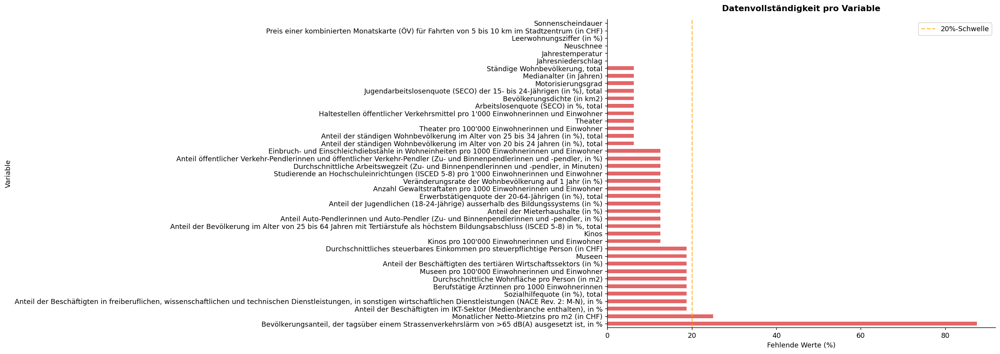


Variablen mit >20% fehlenden Werten: 2


In [ ]:
#  Datenqualität: Fehlende Werte pro Variable
year_cols = [c for c in df_hist.columns if str(c).isdigit()]

missing = df_hist.groupby('Variable')[year_cols].apply(
    lambda x: x.isna().sum().sum() / x.size * 100
).sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(10, 8))
missing.plot(kind='barh', ax=ax, color='#d62728', alpha=0.7)
ax.set_xlabel('Fehlende Werte (%)')
ax.set_title('Datenvollständigkeit pro Variable', fontweight='bold', pad=12)
ax.axvline(20, color='orange', linestyle='--', alpha=0.7, label='20%-Schwelle')
ax.legend()
plt.show()
print(f'\nVariablen mit >20% fehlenden Werten: {(missing > 20).sum()}')

Drei Hilfsfunktionen speichern wiederkehrende Zugriffslogik fest und halten den nachfolgenden Code lesbar.

find_var(): sucht Variable im Datensatz, auch bei abweichenden Bezeichnugen die in den Rohdaten aufkommen.

get_var(): transformiert den Datensatz in ein langes Format welche sich besser für Zeitreihen-Plots eignet.

latest_val(): liefert aktuellsten verfügaren Wert einer Variable für eine bestimmte Stadt. Dazu da, da nicht alle Variablen für alle Jahre erhoben wurden.

In [ ]:
# Hilfsfunktionen
def find_var(variable_name):
    #Findet Variable auch mit Kernstadt / Proxy Suffix.
    exact = df_hist[df_hist['Variable'] == variable_name]
    if not exact.empty: return exact
    return df_hist[df_hist['Variable'].str.startswith(variable_name)]

def get_var(variable_name, years=None):
    #DataFrame (lang): Stadt | Jahr | Wert für eine Variable.
    cols = years if years else year_cols
    subset = find_var(variable_name).copy()
    if subset.empty:
        print(f'Variable nicht gefunden: {variable_name}')
        return pd.DataFrame(columns=['Stadt','Jahr','Wert'])
    melted = subset.melt(id_vars='Stadt', value_vars=cols,
                         var_name='Jahr', value_name='Wert')
    melted['Jahr'] = melted['Jahr'].astype(int)
    return melted.dropna(subset=['Wert'])

def latest_val(variable_name, city):
    #Neuester verfügbarer Wert einer Variable für eine Stadt.
    subset = find_var(variable_name)
    row = subset[subset['Stadt'] == city]
    if row.empty: return None
    for yr in reversed(year_cols):
        v = row.iloc[0].get(yr)
        if pd.notna(v): return v
    return None

# Test
test = get_var('Ständige Wohnbevölkerung, total')
print(test.tail())

         Stadt  Jahr       Wert
85        Bern  2024   441458.0
86        Genf  2024   625704.0
87    Lausanne  2024   457442.0
88  St. Gallen  2024   182502.0
89      Zürich  2024  1486480.0


<a id='schritt-3'></a>
## Schritt 3 – Analyse & Visualisierung
CPA Step 3: Analyze the data and extract insights

In einem  ersten Schritt wird die Bevölkerungsentwicklung der Zielstädte betrachtet. Die Kennzahl liefert Kontext bezüglich Grösse und Dynamik der jeweiligen Standorte. So können spätere Kennzahlen richtig zugeordnet werden.

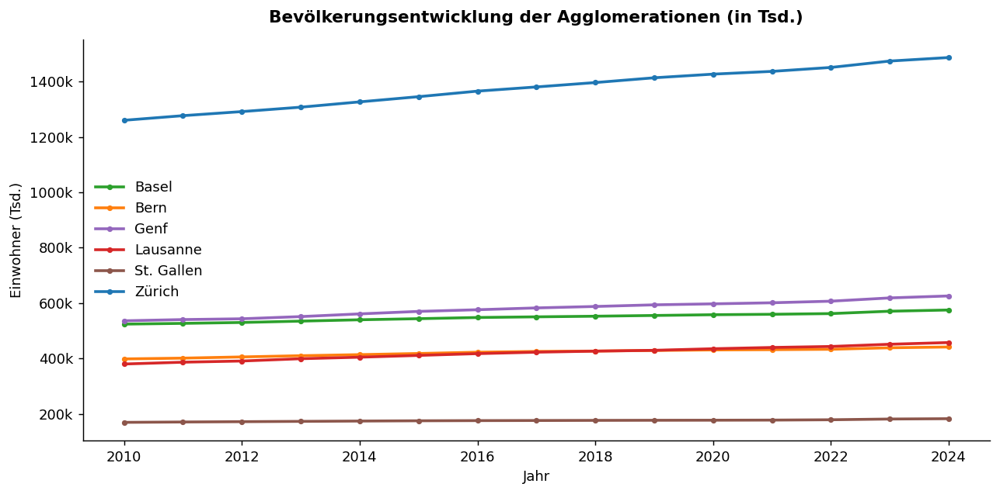

In [ ]:
# 3.1 Bevölkerungsentwicklung
data = get_var('Ständige Wohnbevölkerung, total')

fig, ax = plt.subplots(figsize=(10, 5))
for city, grp in data.groupby('Stadt'):
    ax.plot(grp['Jahr'], grp['Wert'] / 1000,
            color=CITY_COLORS[city], marker='o', markersize=3,
            linewidth=2, label=city)

ax.set_title('Bevölkerungsentwicklung der Agglomerationen (in Tsd.)',
             fontweight='bold', pad=12)
ax.set_ylabel('Einwohner (Tsd.)')
ax.set_xlabel('Jahr')
ax.legend(frameon=False)
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{x:.0f}k'))
plt.tight_layout()
plt.show()

Die Halt AG sucht explizit junge Fachkräfte. Der Anteil von 20- bis 34-Jährigen ist ein zentraler demografischer Indikator. Die Altersbänder 20-24 und 25-34 aus den BFS-Daten werden summiert und in einem sortierten Ranking dargestellt. Dies beantwortet KAQ 3 direkt.

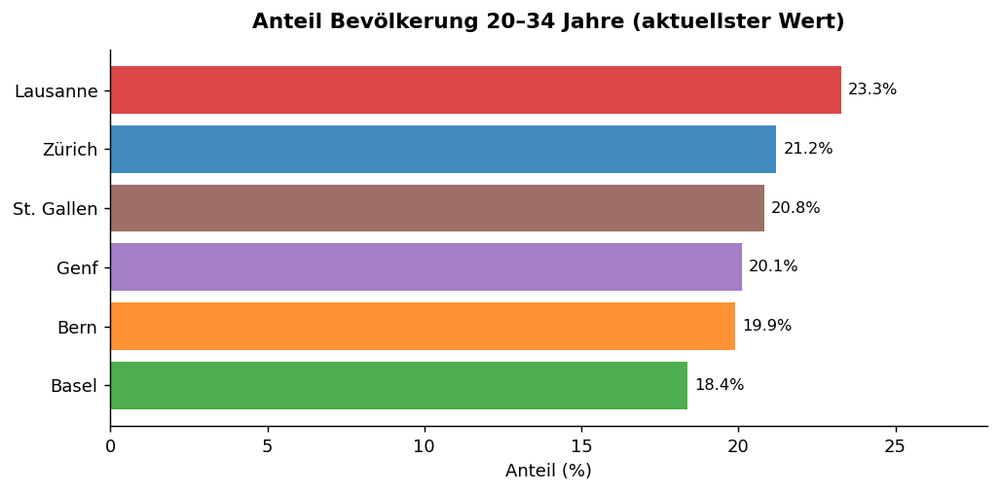

In [ ]:
#3.2 Anteil Junge Bevölkerung (20–34)
last_year = '2022'
young_share = {}
for city in CITIES:
    v1 = latest_val('Anteil der ständigen Wohnbevölkerung im Alter von 20 bis 24 Jahren (in %), total', city)
    v2 = latest_val('Anteil der ständigen Wohnbevölkerung im Alter von 25 bis 34 Jahren (in %), total', city)
    if v1 is not None and v2 is not None:
        young_share[city] = float(v1) + float(v2)

ys = pd.Series(young_share).sort_values(ascending=True)
fig, ax = plt.subplots(figsize=(8, 4))
bars = ax.barh(ys.index, ys.values,
               color=[CITY_COLORS[c] for c in ys.index], alpha=0.85)
ax.bar_label(bars, fmt='%.1f%%', padding=4, fontsize=9)
ax.set_xlim(0, ys.max() * 1.2)
ax.set_title('Anteil Bevölkerung 20–34 Jahre (aktuellster Wert)',
             fontweight='bold', pad=12)
ax.set_xlabel('Anteil (%)')
plt.tight_layout()

Die Arbeitslosenquote wird über den Beobachtungszeitraum dargestellt. Die graue Schattierung markiert die COVID-Phase, interessanterweise war dort kein Anstieg zu verzeichnen. Die Visualisierung adressiert KAQ 2 und zeigt wie Stabil der lokale Arbeitsmarkt ist.

Für das Freizeit- und Kulturangebot werden die drei Indikatoren Kinos, Museen und Theater je 100000 Einwohner verglichen. Diese Indikatoren fliessen in die Dimension Lebensqualität ein und beantworten KAQ 5.

Sonnenscheindauer, Niederschlag und Mitteltemperatur ergänzen die Lebensqualitäts-Dimension um umweltbezogene Faktoren. Dabei wird der Mittelwert über den verfügbaren Zeitraum gebildet, um kurzfristige Wetterschwankungen zu glätten und die normative Klimasituation zu zeigen. Da für Lausanne keine direkten Klimadaten vorliegen, wird Neuenburg als Proxy verwendet.

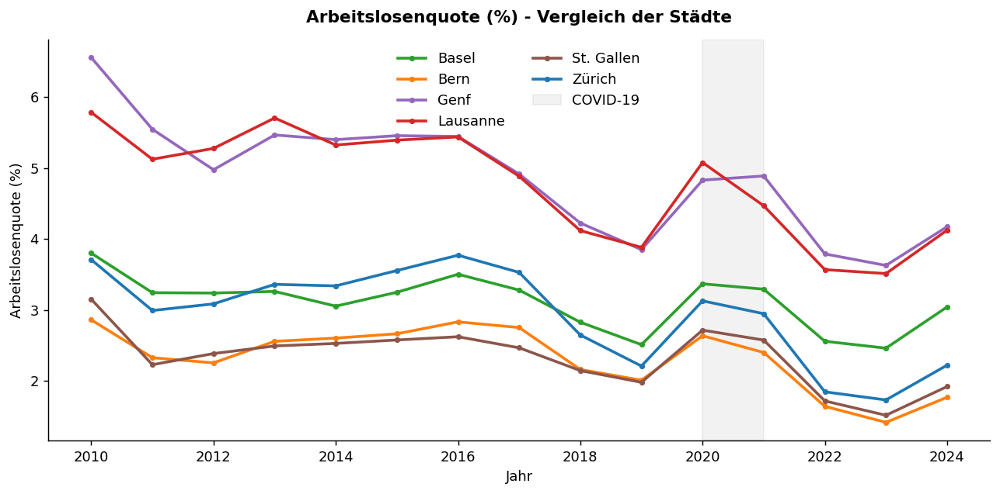

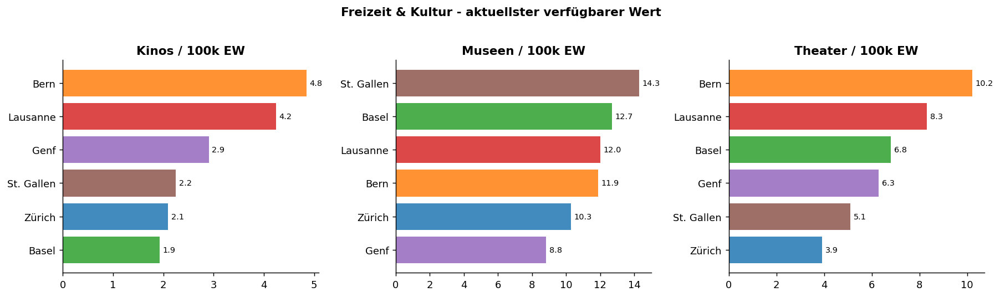

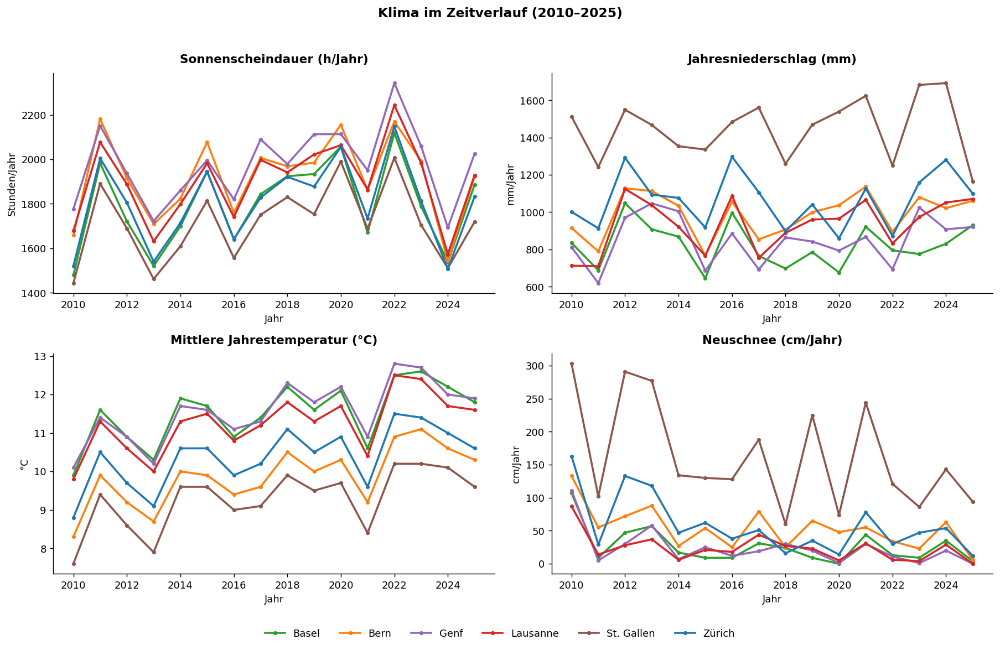

In [ ]:
#3.3a Arbeitslosenquote im Zeitverlauf
data = get_var('Arbeitslosenquote (SECO) in %, total')
fig, ax = plt.subplots(figsize=(10, 5))
for city, grp in data.groupby('Stadt'):
    ax.plot(grp['Jahr'], grp['Wert'], color=CITY_COLORS[city],
            marker='o', markersize=3, linewidth=2, label=city)

# COVID-Markierung
ax.axvspan(2020, 2021, alpha=0.1, color='gray', label='COVID-19')
ax.set_title('Arbeitslosenquote (%) - Vergleich der Städte',
             fontweight='bold', pad=12)
ax.set_ylabel('Arbeitslosenquote (%)')
ax.set_xlabel('Jahr')
ax.legend(frameon=False, ncol=2)
plt.tight_layout()
plt.show()

# 3.3b Freizeit & Kultur
freizeit_vars = {
    'Kinos':   "Kinos pro 100'000 Einwohnerinnen und Einwohner",
    'Museen':  "Museen pro 100'000 Einwohnerinnen und Einwohner",
    'Theater': "Theater pro 100'000 Einwohnerinnen und Einwohner",
}
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for ax, (label, var) in zip(axes, freizeit_vars.items()):
    data_f = get_var(var)
    if data_f.empty: continue
    last = data_f.groupby('Stadt')['Wert'].last().sort_values()
    bars = ax.barh(last.index, last.values,
                   color=[CITY_COLORS[c] for c in last.index], alpha=0.85)
    ax.bar_label(bars, fmt='%.1f', padding=3, fontsize=8)
    ax.set_title(f'{label} / 100k EW', fontweight='bold')
plt.suptitle('Freizeit & Kultur - aktuellster verfügbarer Wert', fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# 3.3c Klima im Zeitverlauf: alle vier Book2-Indikatoren
klima_plots = [
    ('Sonnenscheindauer',  'Sonnenscheindauer (h/Jahr)',     'Stunden/Jahr'),
    ('Jahresniederschlag', 'Jahresniederschlag (mm)',        'mm/Jahr'),
    ('Jahrestemperatur',   'Mittlere Jahrestemperatur (°C)', '°C'),
    ('Neuschnee',          'Neuschnee (cm/Jahr)',            'cm/Jahr'),
]

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
axes = axes.flatten()

for ax, (var, title, ylabel) in zip(axes, klima_plots):
    for city, grp in get_var(var).groupby('Stadt'):
        grp = grp.sort_values('Jahr')
        ax.plot(grp['Jahr'], grp['Wert'], color=CITY_COLORS[city],
                marker='o', markersize=3, linewidth=2, label=city)
    ax.set_title(title, fontweight='bold', pad=10)
    ax.set_ylabel(ylabel)
    ax.set_xlabel('Jahr')

# gemeinsame Legende für alle vier Diagramme
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, frameon=False, ncol=6,
           loc='lower center', bbox_to_anchor=(0.5, -0.01))
plt.suptitle('Klima im Zeitverlauf (2010–2025)', fontweight='bold', fontsize=13)
plt.tight_layout(rect=[0, 0.04, 1, 0.96])
plt.show()

Dieses Streudiagramm visualisiert das Verhältnis von Mietkosten zu Einkommen. Dies fungiert als zentrales Lohn/Kostenverhältnis aus KAQ 1. Städte im oberen linken Quadranten wären aus Kaufkraftsicht für junge Arbeitnehmende am attraktivsten. Die Darstellung verbindet die Dimensionen Arbeitsmarkt und Wohnen/Kosten in einem Diagramm.
Die Preisentwicklung von ÖV-Monatskarten für Strecken von 5-10km zum Stadtzentrum gibt Auskunft über die Mobilitätskosten. Die Zeitreihe zeigt wie stabil oder volatil die Tarifgestaltung pro Stadt ist.

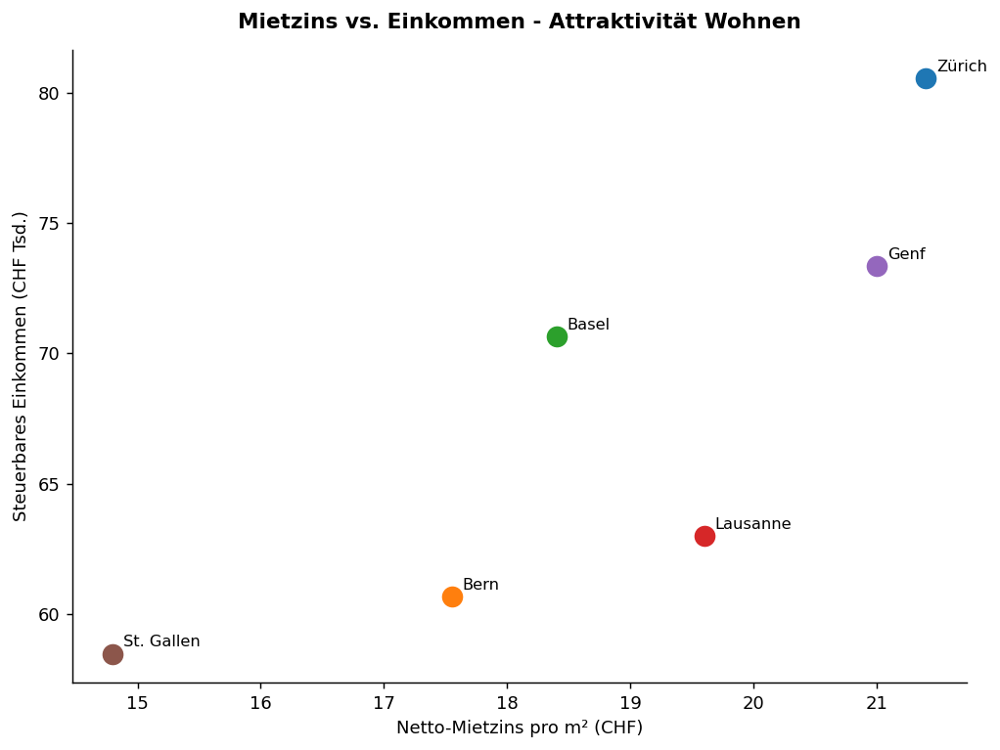

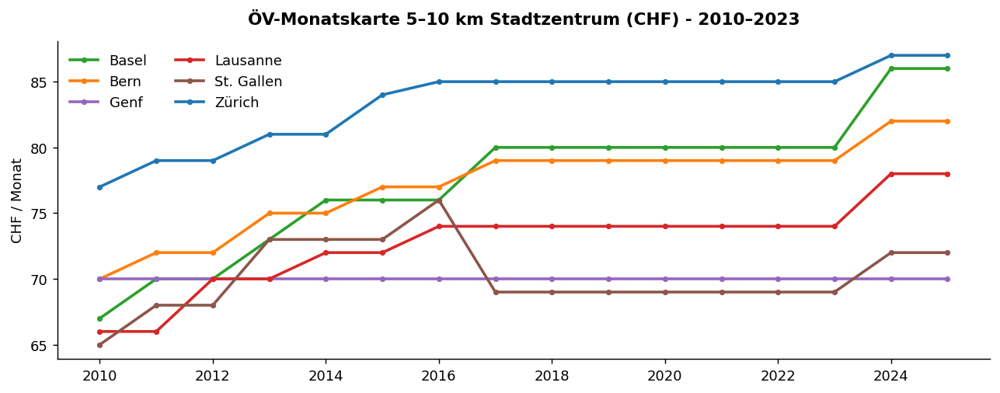

In [ ]:
# 3.4a Mietzins vs. Einkommen (Scatter)
VAR_RENT   = 'Monatlicher Netto-Mietzins pro m2 (in CHF)'
VAR_INCOME = 'Durchschnittliches steuerbares Einkommen pro steuerpflichtige Person (in CHF)'

fig, ax = plt.subplots(figsize=(8, 6))
for city in CITIES:
    r = latest_val(VAR_RENT, city)
    i = latest_val(VAR_INCOME, city)
    if r is not None and i is not None:
        ax.scatter(float(r), float(i)/1000, color=CITY_COLORS[city], s=120, zorder=5)
        ax.annotate(city, (float(r), float(i)/1000),
                    xytext=(6,4), textcoords='offset points', fontsize=9)
ax.set_xlabel('Netto-Mietzins pro m² (CHF)')
ax.set_ylabel('Steuerbares Einkommen (CHF Tsd.)')
ax.set_title('Mietzins vs. Einkommen - Attraktivität Wohnen', fontweight='bold', pad=12)
plt.tight_layout()
plt.show()

# 3.4b ÖV-Monatskarte im Zeitverlauf
VAR_OV = 'Preis einer kombinierten Monatskarte (ÖV) für Fahrten von 5 bis 10 km im Stadtzentrum (in CHF)'
data_ov = get_var(VAR_OV)
fig, ax = plt.subplots(figsize=(10, 4))
for city, grp in data_ov.groupby('Stadt'):
    ax.plot(grp['Jahr'], grp['Wert'], color=CITY_COLORS[city],
            linewidth=2, marker='o', markersize=3, label=city)
ax.set_title('ÖV-Monatskarte 5–10 km Stadtzentrum (CHF) - 2010–2023',
             fontweight='bold', pad=12)
ax.set_ylabel('CHF / Monat')
ax.legend(frameon=False, ncol=2)
plt.tight_layout()
plt.show()

Vor der Indexberechnung wird geprüft welche Indikatoren stark miteinander korrelieren. Hochkorrelierende Variablen würden bei einer Aggregation einzelne Dimensionen überproportional gewichten. Die Korrelationsmatrix zeigt die Zusammenhänge zwischen allen Indikatoren über die sechs Städte als Beobachtungen. Stark positive oder negative Korrelationen werden bei der Auswahl der finalen Indexvariablen berücksichtigt.

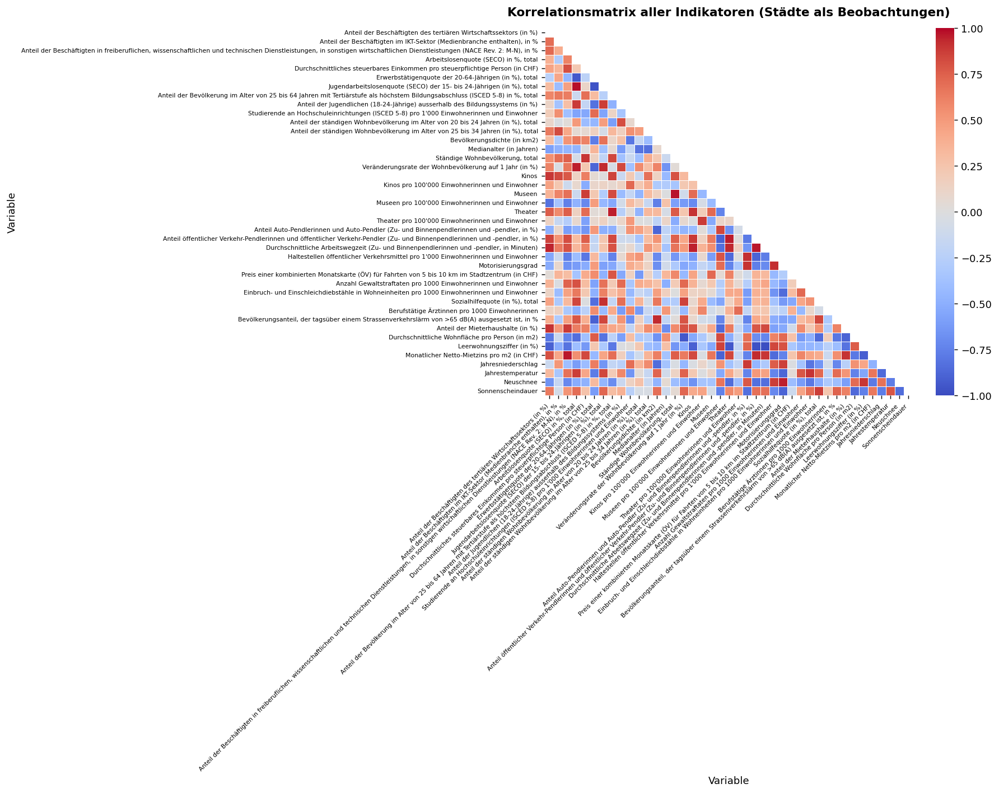

In [ ]:
# 3.6 Korrelationsanalyse
corr_data = []
for var in df_hist['Variable'].unique():
    row = {'Variable': var}
    for city in CITIES:
        v = latest_val(var, city)
        row[city] = float(v) if v is not None else None #same
    corr_data.append(row)

corr_df = pd.DataFrame(corr_data).set_index('Variable').T
corr_df = corr_df.apply(pd.to_numeric, errors='coerce').dropna(axis=1, thresh=4)
corr_matrix = corr_df.corr()

fig, ax = plt.subplots(figsize=(14, 11))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, annot=False, cmap='coolwarm',
            center=0, ax=ax, linewidths=0.3, vmin=-1, vmax=1)
ax.set_title('Korrelationsmatrix aller Indikatoren (Städte als Beobachtungen)',
             fontweight='bold', pad=12)
plt.xticks(fontsize=6, rotation=45, ha='right')
plt.yticks(fontsize=6)
plt.tight_layout()
plt.show()

Es werden zusätzlich noch die fünf stärksten positiven und negativen Korrelationen untersucht: Die Resultate werden wie folgt interpretiert.

Der positive Zusammenhang der beiden Arbeitslosenquoten und der negative Zusammenhang zwischen Erwerbstätigenquote und Arbeitslosenquote waren zu erwarten, sollen aber noch genauer untersucht werden.

Beim positiven Zusammenhang zwischen Wohnbevölkerung und Museen wird in der weiteren Analyse nur der relative Wert pro hunderttausend Einwohner betrachtet.

Es gibt auch Korrelationen, welche für unsere Dimensionen besonders wertvoll sind und bei richtiger Zuordnung die Analyse stärken, beispielsweise:

*   Öffentlicher Verkehr Pendler und Arbeitswegzeit deuten darauf hin, dass ÖV-Nutzer längere Arbeitswege haben.
*   Leerwohnungsziffer und Arbeitswegzeit deuten darauf hin, dass es in strukturschwächeren Gebieten mehr leere Wohnungen gibt.

Manche Korrelationen sind zwar interessant und könnten einen kausalen Zusammenhang aufweisen, sind aber für die Standortanalyse weniger relevant:

*   Anteil der Beschäftigten in freiberuflichen, wissenschaftlichen und technischen Dienstleistungen und monatlicher Netto-Mietzins weisen darauf hin, dass diese Berufsgruppen eher in teureren Städten angesiedelt sind. Diesem Faktor wird also in anderen Dimensionen (insb. Wohnen) genügend Rechnung getragen und er soll hier nicht zusätzlich untersucht werden.
*   Theater und Anteil öffentlicher Verkehr Pendler oder Leerwohnungsziffer weisen auf einen zentralen Standort von Theatern hin, wo die Leerwohnungsziffer tief und der Anteil an ÖV-Pendlern hoch ist. Aufgrund der fehlenden Normalisierung (Theater nicht relativ zur Gesamtbevölkerung) kann es sich hierbei auch um eine Scheinkorrelation handeln, bei welcher kein kausaler Zusammenhang gegeben ist.


In [ ]:
corr_pairs = corr_matrix.unstack()

# Selbstkorrelationen (1.0) und Duplikate entfernen
filtered_pairs = corr_pairs[abs(corr_pairs) < 1.0].drop_duplicates()
sorted_correlations = filtered_pairs.sort_values(ascending=False)

print("5 stärkste positive Korrelationen:")
print(sorted_correlations.head(5))
print("5 stärkste negative Korrelationen:")
print(sorted_correlations.tail(5))

5 stärkste positive Korrelationen:
Variable                                                                                                                                                                   Variable                                                                                                                 
Arbeitslosenquote (SECO) in %, total                                                                                                                                       Jugendarbeitslosenquote (SECO) der 15- bis 24-Jährigen (in %), total                                                         0.980285
Ständige Wohnbevölkerung, total                                                                                                                                            Museen                                                                                                                       0.973287
Anteil der Beschäftigten in freiberuflichen, wissenschaftliche

Obwohl die Jugendarbeitslosenquote äusserst stark mit der allgemeinen Arbeitslosenquote korreliert, da die Zielgruppe junge Erwachsene sind, sollen beide einbezogen werden. Es ist für die Analyse wichtig, dass diese altersspezifischen Aspekte isoliert innerhalb der Dimension Arbeitsmarkt mitbetrachtet werden.

Interessant ist, dass Zürich bei der Jugendarbeitslosenquote den niedrigsten Wert aufweist, während bei der allgemeinen Arbeitslosenquote Bern und St. Gallen niedrigere Werte aufweisen. Die Jugendarbeitslosenquote ist einzig in Zürich und Lausanne niedriger als die allgemeine Arbeitslosenquote, was einen leichteren Berufseinstieg für junge Fachkräfte bedeuten kann.

Der Aspekt der Erwerbstätigenquote in Verbindung mit der Arbeitslosenquote ist für die Halt AG relevant, da dieser uns ein besseres Bild der lokalen Wirtschaftsdynamik liefert. Eine hohe Erwerbstätigenquote, welche in unserem Modell bewusst positiv gewertet wird, ist ein starkes Indiz für ein aktives, leistungsorientiertes, wirtschaftliches Umfeld. Kombiniert mit einer tiefen Arbeitslosenquote signalisiert dies jungen IT-Talenten attraktive, sichere und dynamische Karrieremöglichkeiten.

Die niedrigere Erwerbstätigenquote trotz tiefer Arbeitslosigkeit in St.Gallen lässt vermuten, dass zwar viele Personen dort studieren, junge Fachkräfte aber nach der Ausbildung ins wirtschaftlich dynamischere Zürich abwandern.

In [ ]:
fig = px.scatter(corr_df, x='Jugendarbeitslosenquote (SECO) der 15- bis 24-Jährigen (in %), total', y='Arbeitslosenquote (SECO) in %, total', hover_name=corr_df.index, color=corr_df.index,
    color_discrete_map=CITY_COLORS,text=corr_df.index, labels={'index': 'Stadt'})
fig.update_layout(template='plotly_white')
fig.update_traces(textposition='top center', cliponaxis=False, marker=dict(size=14))

fig.show()

x_var1 = 'Jugendarbeitslosenquote (SECO) der 15- bis 24-Jährigen (in %), total'
y_var1 = 'Arbeitslosenquote (SECO) in %, total'
r_wert1 = corr_df[x_var1].corr(corr_df[y_var1])
print("Pearson Korrelationskoeffizient (r-Wert):")
print(r_wert1)

fig = px.scatter(corr_df, x='Erwerbstätigenquote der 20-64-Jährigen (in %), total', y='Arbeitslosenquote (SECO) in %, total', hover_name=corr_df.index, color=corr_df.index,
    color_discrete_map=CITY_COLORS, text=corr_df.index, labels={'index': 'Stadt'})
fig.update_layout(template='plotly_white')
fig.update_traces(textposition='top center', cliponaxis=False, marker=dict(size=14))

fig.show()

x_var2 = 'Erwerbstätigenquote der 20-64-Jährigen (in %), total'
y_var1 = 'Arbeitslosenquote (SECO) in %, total'
r_wert2 = corr_df[x_var2].corr(corr_df[y_var1])
print("Pearson Korrelationskoeffizient (r-Wert):")
print(r_wert2)

Pearson Korrelationskoeffizient (r-Wert):
0.9802853455945035


Pearson Korrelationskoeffizient (r-Wert):
-0.94002497562428


---
<a id='schritt-3b'></a>
## Schritt 3b – Prognose 2024–2026

Im nächsten Schritt wurde eine Prognose mittels Compound Annual Growth Rate (CAGR) erstellt. Diese Wachstumsrate ermittelt, wie sich eine Kennzahl über einen bestimmten Zeitraum verändert, wenn sie jedes Jahr im gleichen Tempo wächst und dabei stets auf dem Wert des Vorjahres aufbaut. Für unseren Anwendungsfall wurden zudem ein optimistisches und ein pessimistisches Szenario erstellt.

**Methodik:**
- Basisprognose (moderat): CAGR der letzten 5 verfügbaren Jahre, linear extrapoliert
- Szenario optimistisch: 75. Perzentile der historischen Jahreswachstumsraten
- Szenario pessimistisch: 25. Perzentile der historischen Jahreswachstumsraten

In [ ]:
# Prognose-Engine: CAGR + Szenarien
FORECAST_YEARS = [2024, 2025, 2026] # Jahre, die vorhergesagt werden sollen
N_HIST_YEARS   = 5   # Anzahl historischer Jahre für CAGR-Berechnung
#Berechnet CAGR-Basisprognose + optimistisches / pessimistisches Szenario
def compute_forecast(city, variable, n=N_HIST_YEARS):
    row = df_hist[(df_hist['Variable'] == variable) & (df_hist['Stadt'] == city)] #Datenzeile herausfiltern
    if row.empty:
        return None

    # Alle verfügbaren Jahreswerte extrahieren (aufsteigend sortiert) und in eine Zeitreihe umbauen
    year_cols_num = sorted([c for c in df_hist.columns if str(c).isdigit()], key=int)
    series = (
        row[year_cols_num].T
        .rename(columns={row.index[0]: 'wert'})
        .dropna()
    )
    series.index = series.index.astype(int)
    #Datenpunkte müssen ein Anfang und ein Ende haben
    if len(series) < 2:
        return None

    # Letzte n Jahre für CAGR
    recent = series.tail(n)
    v0, v1 = recent['wert'].iloc[0], recent['wert'].iloc[-1]
    y0, y1 = recent.index[0], recent.index[-1]
    span = y1 - y0

    if v0 == 0 or span == 0:
        return None
    #CAGR-Formel (nur bei durchwegs positiven Werten geometrisch definiert)
    if v0 > 0 and v1 > 0:
        cagr = (v1 / v0) ** (1 / span) - 1
    else:
        cagr = 0.0    # Fallback bei <= 0-Werten (z.B. Veränderungsraten) -> kein geom. Wachstum

    # Jahr-über-Jahr Wachstumsraten für Szenario-Bandbreite 75. und 25. Perzentil
    yoy = series['wert'].pct_change().replace([np.inf, -np.inf], np.nan).dropna().values  # inf aus Division durch 0 entfernen
    opt_rate = float(np.percentile(yoy, 75)) if len(yoy) >= 2 else cagr
    pes_rate = float(np.percentile(yoy, 25)) if len(yoy) >= 2 else cagr

    #Zukunftsjahre berechnen - robuste geometrische Fortschreibung
    def _grow(base, rate, steps):
        # entartete Raten abfangen: Faktor <= 0 (z.B. Wert fiel auf 0 -> -100%) oder nicht endlich
        factor = 1.0 + rate
        if not np.isfinite(factor) or factor <= 0:
            return float(base)        # letzten Wert halten statt 0**n / inf**n
        return float(base) * factor ** steps

    result = {'last_val': v1, 'last_year': y1, 'cagr': cagr}
    #für jedes Prognosejahr
    for fy in FORECAST_YEARS:
        n_fwd = fy - y1
        result[fy] = {
            'basis': _grow(v1, cagr,     n_fwd),
            'opt':   _grow(v1, opt_rate, n_fwd),
            'pes':   _grow(v1, pes_rate, n_fwd),
        }
    return result

# Testausgabe: Für jedes Prognosejahr werden drei Szenarien ausgegeben
test = compute_forecast('Zürich', 'Monatlicher Netto-Mietzins pro m2 (in CHF)')
print('Beispiel Mietzins Zürich:')
print(f"  Letzter IST-Wert: {test['last_val']} ({test['last_year']})")
print(f"  CAGR: {test['cagr']*100:.2f}%")
for fy in FORECAST_YEARS:
    d = test[fy]
    print(f"  {fy}: Basis={d['basis']:.2f}  Opt={d['opt']:.2f}  Pes={d['pes']:.2f}")

Beispiel Mietzins Zürich:
  Letzter IST-Wert: 21.4 (2023)
  CAGR: 1.83%
  2024: Basis=21.79  Opt=21.76  Pes=21.45
  2025: Basis=22.19  Opt=22.13  Pes=21.51
  2026: Basis=22.60  Opt=22.50  Pes=21.56


Die Prognose wird auf alle Kombinationen aus Variablen und Städte angewendet und daraus wird eine Tabelle mit IST-Wert, CAGR und den drei Szenarien pro Prognosejahr erzeugt. Dies dient als Grundlage für die folgende Visualisierung.

In [ ]:
# Prognosetabelle: alle Variablen × alle Städte
all_vars  = df_hist['Variable'].unique()
fc_rows   = []

for var in all_vars:
    for city in CITIES:
        fc = compute_forecast(city, var)
        if fc is None:
            continue
        cat = df_hist[df_hist['Variable'] == var]['Kategorie'].values[0]
        row = {
            'Kategorie': cat,
            'Variable':  var,
            'Stadt':     city,
            'CAGR_%':    round(fc['cagr'] * 100, 3),
            'IST_letzt': fc['last_val'],
            'IST_Jahr':  fc['last_year'],
        }
        for fy in FORECAST_YEARS:
            row[f'Basis_{fy}']  = round(fc[fy]['basis'], 2)
            row[f'Opt_{fy}']    = round(fc[fy]['opt'],   2)
            row[f'Pes_{fy}']    = round(fc[fy]['pes'],   2)
        fc_rows.append(row)

df_forecast = pd.DataFrame(fc_rows)
print(f'Prognosetabelle: {df_forecast.shape[0]} Zeilen ({df_forecast["Variable"].nunique()} Variablen × {df_forecast["Stadt"].nunique()} Städte)')
df_forecast.head(6)

Prognosetabelle: 246 Zeilen (41 Variablen × 6 Städte)


,Kategorie,Variable,Stadt,CAGR_%,IST_letzt,IST_Jahr,Basis_2024,Opt_2024,Pes_2024,Basis_2025,Opt_2025,Pes_2025,Basis_2026,Opt_2026,Pes_2026
0,Arbeitsmarkt,Anteil der Beschäftigten des tertiären Wirtsch...,Zürich,0.202,86.938565,2023,87.11,87.20,87.11,87.29,87.46,87.27,87.47,87.72,87.44
1,Arbeitsmarkt,Anteil der Beschäftigten des tertiären Wirtsch...,Bern,0.388,84.435500,2023,84.76,84.70,84.62,85.09,84.96,84.81,85.42,85.22,84.99
2,Arbeitsmarkt,Anteil der Beschäftigten des tertiären Wirtsch...,Basel,0.209,77.109065,2023,77.27,77.45,77.12,77.43,77.79,77.14,77.59,78.14,77.15
3,Arbeitsmarkt,Anteil der Beschäftigten des tertiären Wirtsch...,Lausanne,0.165,85.888250,2023,86.03,86.10,85.99,86.17,86.32,86.10,86.31,86.54,86.21
4,Arbeitsmarkt,Anteil der Beschäftigten des tertiären Wirtsch...,Genf,0.157,86.748660,2023,86.89,86.95,86.74,87.02,87.16,86.73,87.16,87.36,86.72
5,Arbeitsmarkt,Anteil der Beschäftigten des tertiären Wirtsch...,St. Gallen,0.295,76.125675,2023,76.35,76.54,76.31,76.58,76.96,76.50,76.80,77.38,76.69


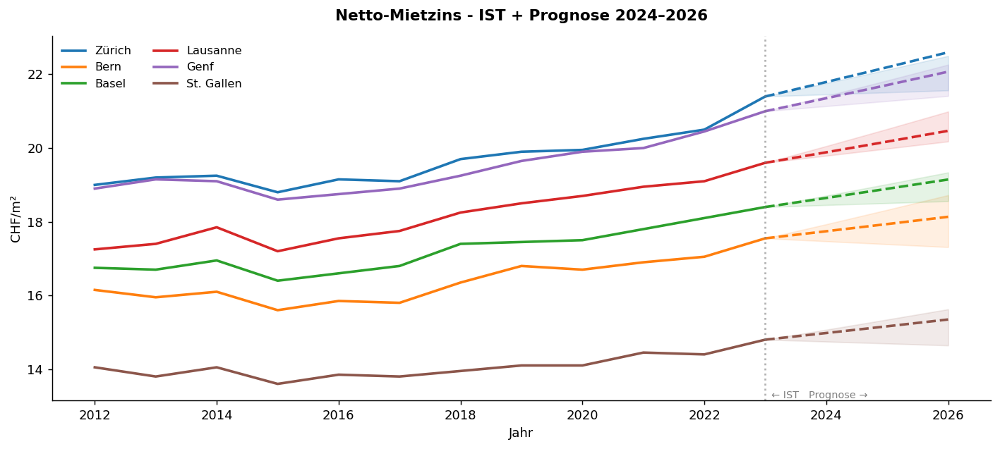

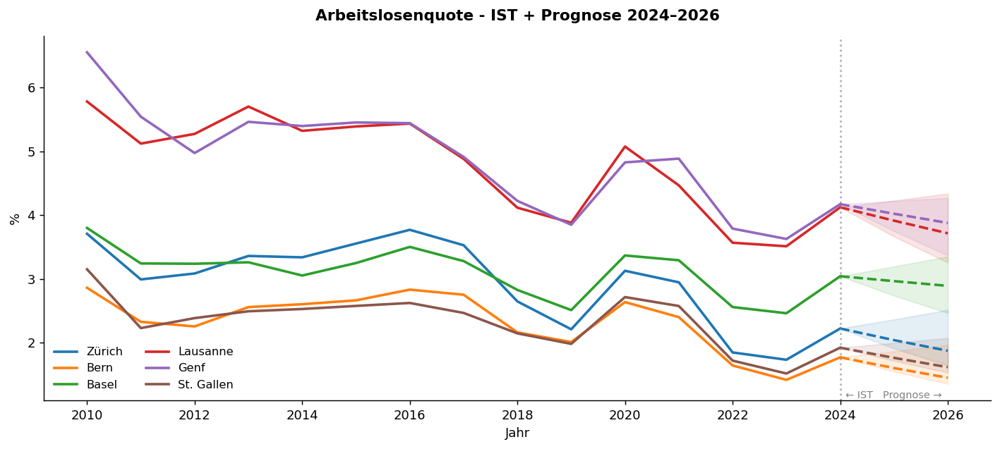

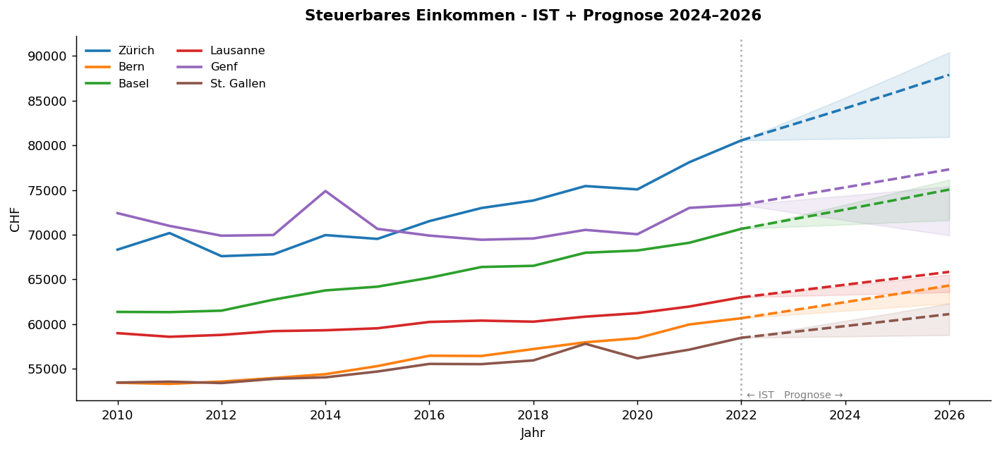

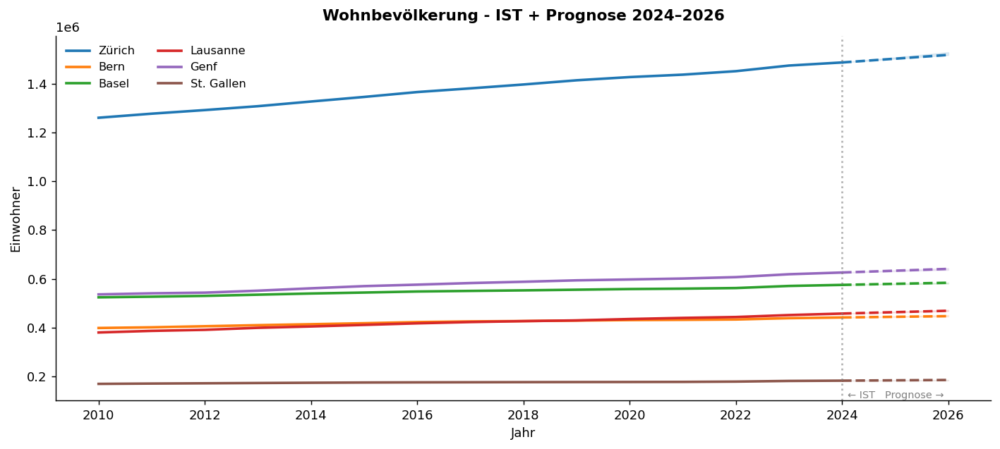

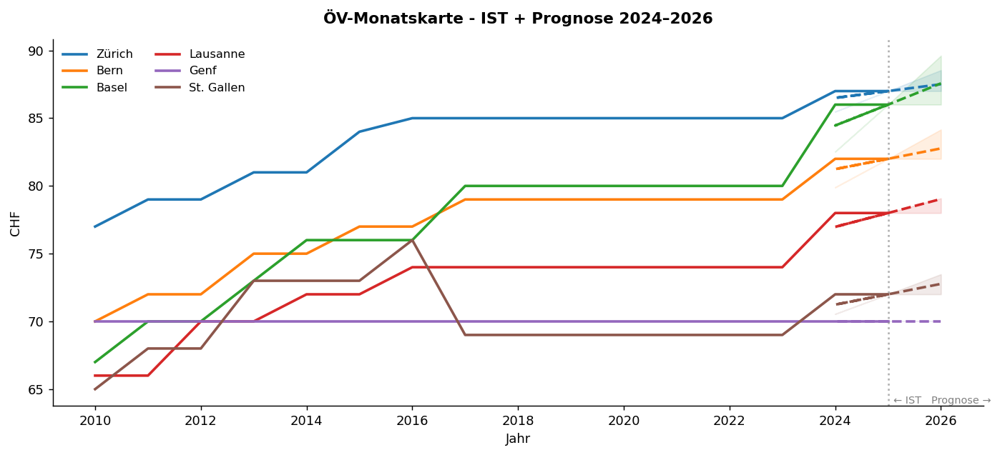

In [ ]:
# Visualisierung: Prognose mit Szenario-Fächer
def plot_forecast(variable, ylabel=None, title=None):
    hist_data = get_var(variable)
    if hist_data.empty:
        print(f'Keine Daten für: {variable}'); return
    fig, ax = plt.subplots(figsize=(11, 5))
    for city in CITIES:
        color = CITY_COLORS[city]
        ch = hist_data[hist_data['Stadt'] == city].sort_values('Jahr')
        ax.plot(ch['Jahr'], ch['Wert'], color=color, linewidth=2, label=city)
        fc = compute_forecast(city, variable)
        if fc is None: continue
        x_fc   = [fc['last_year']] + FORECAST_YEARS
        y_base = [fc['last_val']]  + [fc[fy]['basis'] for fy in FORECAST_YEARS]
        y_opt  = [fc['last_val']]  + [fc[fy]['opt']   for fy in FORECAST_YEARS]
        y_pes  = [fc['last_val']]  + [fc[fy]['pes']   for fy in FORECAST_YEARS]
        ax.plot(x_fc, y_base, color=color, linewidth=2, linestyle='--')
        ax.fill_between(x_fc, y_pes, y_opt, color=color, alpha=0.12)
    ax.axvline(max(hist_data['Jahr']), color='gray', linestyle=':', alpha=0.6)
    ax.text(max(hist_data['Jahr']) + 0.1, ax.get_ylim()[0],
            '← IST   Prognose →', fontsize=8, color='gray', va='bottom')
    ax.set_title(title or variable, fontweight='bold', pad=12)
    ax.set_ylabel(ylabel or '')
    ax.set_xlabel('Jahr')
    ax.legend(frameon=False, ncol=2, fontsize=9)
    plt.tight_layout()
    safe = variable[:30].replace('/', '-').replace(' ', '_')
    plt.show()


plot_forecast('Monatlicher Netto-Mietzins pro m2 (in CHF)',
    ylabel='CHF/m²', title='Netto-Mietzins - IST + Prognose 2024–2026')

plot_forecast('Arbeitslosenquote (SECO) in %, total',
    ylabel='%', title='Arbeitslosenquote - IST + Prognose 2024–2026')

plot_forecast('Durchschnittliches steuerbares Einkommen pro steuerpflichtige Person (in CHF)',
    ylabel='CHF', title='Steuerbares Einkommen - IST + Prognose 2024–2026')

plot_forecast('Ständige Wohnbevölkerung, total',
    ylabel='Einwohner', title='Wohnbevölkerung - IST + Prognose 2024–2026')

plot_forecast('Preis einer kombinierten Monatskarte (ÖV) für Fahrten von 5 bis 10 km im Stadtzentrum (in CHF)',
    ylabel='CHF', title='ÖV-Monatskarte - IST + Prognose 2024–2026')

<a id='schritt-4'></a>
## Schritt 4 – Attraktivitätsindex & Standortempfehlung
CPA Step 4: Present information to support decision-making

Der Attraktivitätsindex verdichtet die einzelnen Indikatoren zu einer klaren Antwort für die Geschäftsleitung durch eine Kennzahl pro Stadt. Wobei die Kennzahl zwischen 0 und 100 liegt: 0 = relativ am wenigsten Attraktiv im Vergleich der Städte, 100 = relativ am attraktivsten.

Die Herleitung der Gewichtung basiert aus dem methodischen Kapitel in Schritt 1.
`WEIGHTS` ist dabei die Dimensionsgewichtung.
Die Indikatoren haben sehr unterschiedliche Einheiten und Wertebereiche. Damit diese gemeinsam verrechnet werden können, wird jeder Indikatoren auf eine einheitliche Skala von 0 bis 1 normalisiert.
`INDEX_VARS` ist die Zuordnung der einzelnen Indikatoren zu den fünf Dimensionen. Jeder Indikator hat eine Richtungsangabe (+1 = höher ist besser, -1 = tiefer ist besser). Die Indikatoren werden ebenfalls zu den definierten Dimensionen zusammengefasst. Innerhalb jeder Dimension wir der Durchschnitt der zugehörigen Indikatoren gebildet.

`minmax_normalize` skaliert jeden Indikator auf den Bereich 0-1, wobei die Richtungsangabe respektiert wird. Pro Dimension wird der Durchschnitt der normalisierten Indikator-Scores gebildet. Die finale Gesamtbewertung ergibt sich aus der gewichteten Summe der Dimensions-Scores.



In [ ]:
# Attraktivitätsindex berechnen
# Gewichtungen (Summe = 1.0)

WEIGHTS = {
    'Arbeitsmarkt':  0.30,
    'Wohnen':        0.25,
    'Lebensqualität':0.20,
    'Demografie':    0.15,
    'Mobilität':     0.10,
}

# +1 = höher ist besser, -1 = tiefer ist besser
INDEX_VARS = {
    'Arbeitsmarkt': [
        ('Erwerbstätigenquote der 20-64-Jährigen (in %), total',                                                  +1),
        ('Arbeitslosenquote (SECO) in %, total',                                                                  -1),
        ('Jugendarbeitslosenquote (SECO) der 15- bis 24-Jährigen (in %), total',                                  -1),
        ('Durchschnittliches steuerbares Einkommen, das für die direkte Bundessteuer pro steuerpflichtige Person massgebend ist (in CHF)', +1),
        ('Anteil der Beschäftigten im IKT-Sektor (Medienbranche enthalten), in %',                               +1),
        ('Anteil der Beschäftigten des tertiären Wirtschaftssektors (in %)',                                      +1),
    ],
    'Wohnen': [
        ('Monatlicher Netto-Mietzins pro m2 (in CHF)',      -1),
        ('Leerwohnungsziffer (in %)',                        +1),
        ('Durchschnittliche Wohnfläche pro Person (in m2)', +1),
    ],
    'Lebensqualität': [
        ("Museen pro 100'000 Einwohnerinnen und Einwohner",                                          +1),
        ("Theater pro 100'000 Einwohnerinnen und Einwohner",                                         +1),
        ("Kinos pro 100'000 Einwohnerinnen und Einwohner",                                           +1),
        ('Tägliche Sonnenscheindauer in Stunden',                                                    +1),
        ('Mittlere Jahrestemperatur in °C',                                                          +1),
        ('Jahresniederschlag (mm)',                                                                   -1),
        ('Anzahl Gewaltstraftaten pro 1000 Einwohnerinnen und Einwohner',                            -1),
        ('Einbruch- und Einschleichdiebstähle in Wohneinheiten pro 1000 Einwohnerinnen und Einwohner', -1),
    ],
    'Demografie': [
        ('Anteil der ständigen Wohnbevölkerung im Alter von 20 bis 24 Jahren (in %), total', +1),
        ('Anteil der ständigen Wohnbevölkerung im Alter von 25 bis 34 Jahren (in %), total', +1),
        ('Medianalter (in Jahren)',                                                           -1),
        ('Sozialhilfequote (in %), total',                                                    -1),
        ('Anteil der Bevölkerung im Alter von 25 bis 64 Jahren mit Tertiärstufe als höchstem Bildungsabschluss (ISCED 5-8) in %, total', +1),
    ],
    'Mobilität': [
        ('Anteil öffentlicher Verkehr-Pendler (in %)',                                                           +1),
        ('Preis einer kombinierten Monatskarte (ÖV) für Fahrten von 5 bis 10 km im Stadtzentrum (in CHF)',      -1),
        ('Durchschnittliche Arbeitswegzeit (in Minuten)',                                                        -1),
        ('Motorisierungsgrad',                                                                                   -1),
    ],
}
def minmax_normalize(series, direction):
    s = pd.to_numeric(series, errors='coerce').dropna()
    mn, mx = s.min(), s.max()
    if mx == mn: return pd.Series([0.5]*len(s), index=s.index)
    norm = (s - mn) / (mx - mn)
    return norm if direction == 1 else 1 - norm

scores = {dim: {} for dim in WEIGHTS}
for dim, var_list in INDEX_VARS.items():
    dim_scores = []
    for var, direction in var_list:
        raw = {city: latest_val(var, city) for city in CITIES}
        s = pd.Series({k: float(v) for k, v in raw.items() if v is not None})
        if len(s) >= 2:
            dim_scores.append(minmax_normalize(s, direction))
    if dim_scores:
        scores[dim] = pd.concat(dim_scores, axis=1).mean(axis=1).reindex(CITIES)

scores_df = pd.DataFrame(scores)
dims = list(WEIGHTS.keys())
scores_df['Gesamt'] = sum(
    scores_df[dim] * w for dim, w in WEIGHTS.items() if dim in scores_df.columns
)
scores_df = scores_df.sort_values('Gesamt', ascending=False)

print('Attraktivitätsindex (0–100 Punkte):')
print((scores_df * 100).round(1).to_string())

Attraktivitätsindex (0–100 Punkte):
            Arbeitsmarkt  Wohnen  Lebensqualität  Demografie  Mobilität  Gesamt
St. Gallen          57.7   100.0            66.0        48.5       44.1    67.2
Bern                87.0    47.2            80.3        42.2       50.5    65.3
Zürich              93.0    17.8            31.2        73.0       32.8    52.8
Lausanne            39.1    21.7            46.1        75.2       64.2    44.1
Basel               32.8    53.4            31.3        25.1       49.7    38.2
Genf                25.5     3.8            32.1        34.4      100.0    30.2


Das Radardiagramm zeigt für jede Stadt das Profil über die fünf Dimensionen. So zeigt sich, welche Stadt wo punktet oder deren Schwächen liegen. Beispielsweise könnte eine Stadt mit einem ausgewogenen Profil für die Halt AG attraktiver sein, als eine mit einem dominaten Stärke/Schwächebereich.

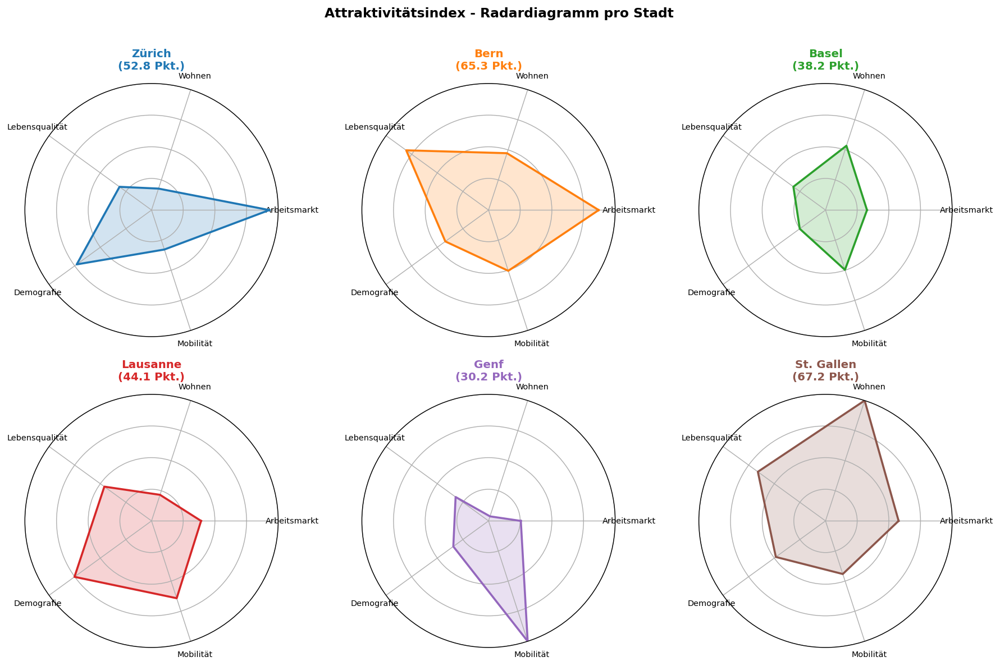

In [ ]:
# Radardiagramm pro Stadt
dims = list(WEIGHTS.keys())
N = len(dims)
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]

fig, axes = plt.subplots(2, 3, figsize=(14, 9),
                          subplot_kw=dict(polar=True))
axes = axes.flatten()

for i, city in enumerate(CITIES):
    ax = axes[i]
    values = scores_df.loc[city, dims].values.tolist() if city in scores_df.index else [0]*N
    values += values[:1]
    ax.plot(angles, values, color=CITY_COLORS[city], linewidth=2)
    ax.fill(angles, values, color=CITY_COLORS[city], alpha=0.2)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(dims, fontsize=8)
    ax.set_ylim(0, 1)
    ax.set_yticks([0.25, 0.5, 0.75, 1.0])
    ax.set_yticklabels(['', '', '', ''], fontsize=6)
    total = scores_df.loc[city, 'Gesamt'] * 100 if city in scores_df.index else 0
    ax.set_title(f'{city}\n({total:.1f} Pkt.)',
                 color=CITY_COLORS[city], fontweight='bold', pad=14, fontsize=11)

if len(CITIES) < len(axes):
    for j in range(len(CITIES), len(axes)):
        fig.delaxes(axes[j])

plt.suptitle('Attraktivitätsindex - Radardiagramm pro Stadt',
             fontweight='bold', fontsize=13, y=1.01)
plt.tight_layout()
plt.show()

Das Horizontaldiagramm zeigt das finale Ranking. Jede Stadt erscheint als Balken, dessen Segmente die Beträge der einzelnen Dimensionen zum Gesamtscore zeigen.

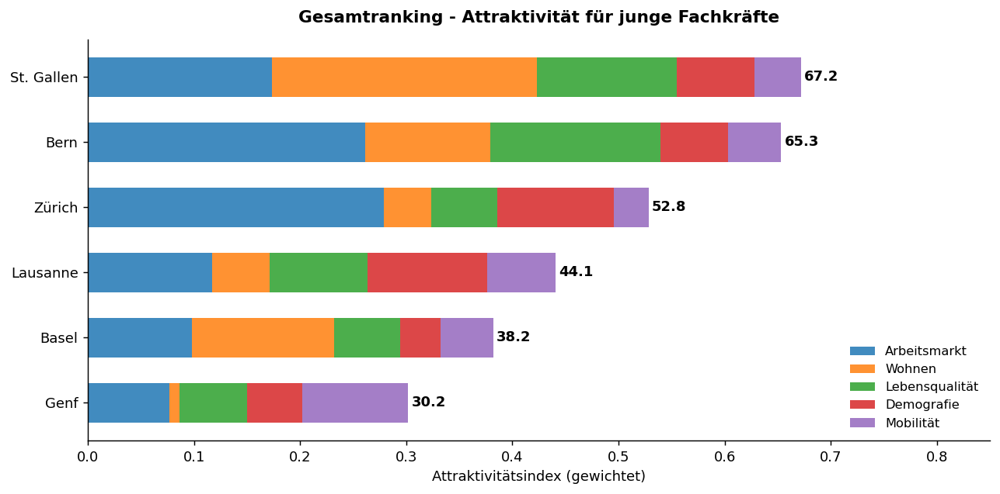


Empfehlung für Halt AG: St. Gallen


In [ ]:
# Gesamtranking - Stacked Bar Chart
plot_data = scores_df[dims].multiply(pd.Series(WEIGHTS), axis=1)
plot_data = plot_data.loc[plot_data.sum(axis=1).sort_values(ascending=True).index]

dim_colors = ['#1f77b4','#ff7f0e','#2ca02c','#d62728','#9467bd']
fig, ax = plt.subplots(figsize=(10, 5))
left = np.zeros(len(plot_data))
for dim, color in zip(dims, dim_colors):
    vals = plot_data[dim].values
    ax.barh(plot_data.index, vals, left=left, label=dim,
            color=color, alpha=0.85, height=0.6)
    left += vals

# Gesamtwert beschriften
for i, city in enumerate(plot_data.index):
    total = scores_df.loc[city, 'Gesamt'] * 100
    ax.text(left[i] + 0.003, i, f'{total:.1f}',
            va='center', ha='left', fontweight='bold', fontsize=10)

ax.set_xlim(0, 0.85)
ax.set_xlabel('Attraktivitätsindex (gewichtet)')
ax.set_title('Gesamtranking - Attraktivität für junge Fachkräfte',
             fontweight='bold', pad=12, fontsize=12)
ax.legend(frameon=False, loc='lower right', fontsize=9)
plt.tight_layout()
plt.show()

winner = scores_df.index[0]
print(f'\nEmpfehlung für Halt AG: {winner}')

Da eine Gewichtsentscheidung subjektive Elemente enthält, wird die Stabilität des Rankings anhand unterscheidlicher Szenatieren getestet. Bleibt die empfohlene Stadt in allen Szenarien an der Spitze oder in den Top 2, gilt das Ergebnis als geltend gegenüber Gewichtungsunsicherheit. Wenn sich die Reihenfolge stark verändert, müssen die Annahmen reflektiert werden.

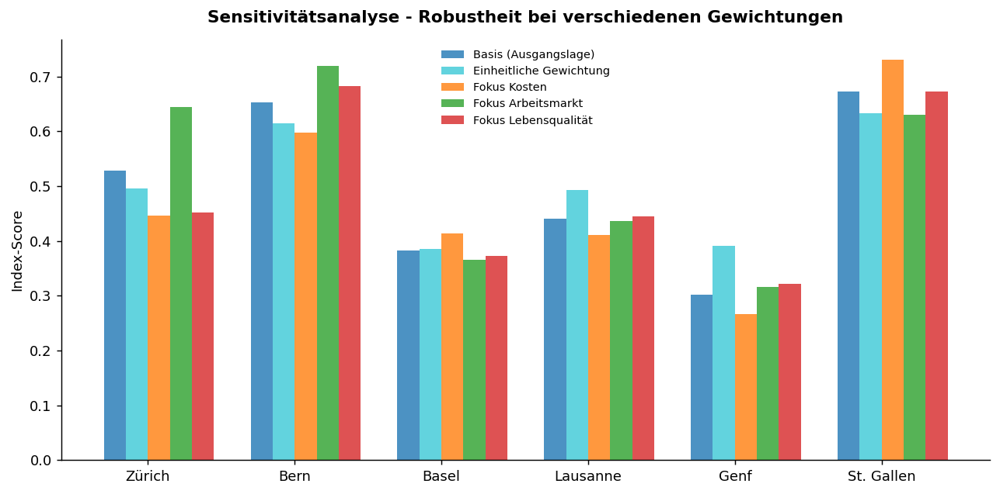

In [ ]:
# Sensitivitätsanalyse: Was passiert bei anderen Gewichtungen?

scenarios = {
    'Basis (Ausgangslage)': {'Arbeitsmarkt':0.30,'Wohnen':0.25,'Lebensqualität':0.20,'Demografie':0.15,'Mobilität':0.10},
    'Einheitliche Gewichtung':{'Arbeitsmarkt':0.20,'Wohnen':0.20,'Lebensqualität':0.20,'Demografie':0.20,'Mobilität':0.20},
    'Fokus Kosten':         {'Arbeitsmarkt':0.20,'Wohnen':0.40,'Lebensqualität':0.15,'Demografie':0.15,'Mobilität':0.10},
    'Fokus Arbeitsmarkt':   {'Arbeitsmarkt':0.50,'Wohnen':0.15,'Lebensqualität':0.15,'Demografie':0.10,'Mobilität':0.10},
    'Fokus Lebensqualität': {'Arbeitsmarkt':0.20,'Wohnen':0.20,'Lebensqualität':0.40,'Demografie':0.10,'Mobilität':0.10},
}

sens_results = {}
for scen_name, weights in scenarios.items():
    total = sum(scores_df[dim] * w for dim, w in weights.items() if dim in scores_df.columns)
    sens_results[scen_name] = total

sens_df = pd.DataFrame(sens_results)

fig, ax = plt.subplots(figsize=(10, 5))
x = np.arange(len(CITIES))
width = 0.15
scen_colors = ['#1f77b4', '#3bc8d6','#ff7f0e','#2ca02c','#d62728']
for i, (scen, color) in enumerate(zip(scenarios.keys(), scen_colors)):
    vals = [sens_df.loc[city, scen] if city in sens_df.index else 0 for city in CITIES]
    ax.bar(x + i*width, vals, width, label=scen, color=color, alpha=0.8)

ax.set_xticks(x + width*1.5)
ax.set_xticklabels(CITIES)
ax.set_ylabel('Index-Score')
ax.set_title('Sensitivitätsanalyse - Robustheit bei verschiedenen Gewichtungen',
             fontweight='bold', pad=12)
ax.legend(frameon=False, fontsize=8)
plt.tight_layout()
plt.show()

Textliche Zusammenfassung der Ergebnisse für die Geschäftsleitung. Enthält Gesamtscore, Ranking aller Städte und Identifikation der stärksten Dimension des Top-Standorts.

In [ ]:
# Zusammenfassung für die Geschäftsleitung
print('STANDORTEMPFEHLUNG FÜR HALT AG')
print(f'\nEmpfohlener Standort: {scores_df.index[0]}')
print(f'   Gesamtscore: {scores_df["Gesamt"].iloc[0]*100:.1f}/100')
print(f'\nRanking:')
for rank, (city, row) in enumerate(scores_df.iterrows(), 1):
    print(f'  {rank}. {city:<12} {row["Gesamt"]*100:.1f} Pkt.')

STANDORTEMPFEHLUNG FÜR HALT AG

Empfohlener Standort: St. Gallen
   Gesamtscore: 67.2/100

Ranking:
  1. St. Gallen   67.2 Pkt.
  2. Bern         65.3 Pkt.
  3. Zürich       52.8 Pkt.
  4. Lausanne     44.1 Pkt.
  5. Basel        38.2 Pkt.
  6. Genf         30.2 Pkt.


<a id='anhang'></a>
## Anhang - Geo-Mapping & Choropleth-Karten
Räumliche Visualisierung des Attraktivitätsindex auf der Schweizer Karte

Die folgenden Karten zeigen den Attraktivitätsindex und ausgewählte Indikatoren **räumlich verortet** auf der Schweizer Kantonsebene.  
Grundlage: GeoJSON-Daten (Dozenten-Repository) + berechneter Index aus Schritt 4.

| Stadt | Kanton(e) | Kürzel |
|-------|-----------|--------|
| Zürich | Zürich | ZH |
| Bern | Bern | BE |
| Basel | Basel-Stadt + Basel-Landschaft | BS, BL |
| Lausanne | Waadt | VD |
| Genf | Genf | GE |
| St. Gallen | St. Gallen | SG |

In [ ]:
KANTON_MAP = {
    'Zürich': 'ZH', 'Bern': 'BE', 'Luzern': 'LU', 'Uri': 'UR',
    'Schwyz': 'SZ', 'Obwalden': 'OW', 'Nidwalden': 'NW', 'Glarus': 'GL',
    'Zug': 'ZG', 'Fribourg': 'FR', 'Solothurn': 'SO', 'Basel-Stadt': 'BS',
    'Basel-Landschaft': 'BL', 'Schaffhausen': 'SH', 'Appenzell Ausserrhoden': 'AR',
    'Appenzell Innerrhoden': 'AI', 'St. Gallen': 'SG', 'Graubünden': 'GR',
    'Aargau': 'AG', 'Thurgau': 'TG', 'Ticino': 'TI', 'Vaud': 'VD',
    'Valais': 'VS', 'Neuchâtel': 'NE', 'Genève': 'GE', 'Jura': 'JU'
}

# Unsere relevanten Kantone (inkl. BS + BL für Basel-Agglomeration)
OUR_CANTONS = {'ZH', 'BE', 'BS', 'BL', 'VD', 'GE', 'SG'}

# GeoJSON laden, Kürzel hinzufügen, sofort filtern
GEO_PATH = 'https://raw.githubusercontent.com/sawubona-repo/BINA-FS24-WORK/master/zDiversExamples/Notebook-GeoMapping/DATA/'
_all = gpd.read_file(GEO_PATH + 'ch-cantons-new.geojson')
_all['KantonKürzel'] = _all['KantonName'].map(KANTON_MAP)

# Erst filtern
_filtered = _all[_all['KantonKürzel'].isin(OUR_CANTONS)].copy()

# Duplikate pro Kanton zusammenführen (mehrere Features sind eine Geometrie)
raw_geodf = _filtered.dissolve(by='KantonKürzel').reset_index()

print(f'GeoFrame gefiltert: {len(raw_geodf)} Kantone')
raw_geodf[['KantonKürzel', 'KantonName']]

GeoFrame gefiltert: 7 Kantone


,KantonKürzel,KantonName
0,BE,Bern
1,BL,Basel-Landschaft
2,BS,Basel-Stadt
3,GE,Genève
4,SG,St. Gallen
5,VD,Vaud
6,ZH,Zürich


Verknüpfung der Indexwerte mit den Kantons-Kürzeln, damit diese räumlich darstellbar werden. Die Tabelle fungiert als Brücke zwischen statistischer Analyse und geografischer Visualisierung.

In [ ]:
# Attraktivitätsindex auf Kantonsebene mappen
# Unsere 6 Städte → Kanton(e) Mapping
# Basel wird BS UND BL zugewiesen (beide Halbkantone gehören zur Agglomeration)

CITY_TO_CANTONS = {
    'Zürich':     ['ZH'],
    'Bern':       ['BE'],
    'Basel':      ['BS', 'BL'],  # beide Halbkantone = Agglomeration
    'Lausanne':   ['VD'],
    'Genf':       ['GE'],
    'St. Gallen': ['SG'],
}

canton_rows = []
for city, cantons in CITY_TO_CANTONS.items():
    score = scores_df.loc[city, 'Gesamt'] * 100 if city in scores_df.index else None
    dim_scores = scores_df.loc[city, dims].to_dict() if city in scores_df.index else {}
    for kuerzel in cantons:
        canton_rows.append({
            'KantonKürzel': kuerzel,
            'Stadt':        city,
            'Index_Gesamt': score,
            **{f'Index_{d}': round(v * 100, 1) for d, v in dim_scores.items()}
        })

index_df = pd.DataFrame(canton_rows)
print('Index-Daten für', len(index_df), 'Kantone:')
print(index_df[['KantonKürzel','Stadt','Index_Gesamt']].to_string())

Index-Daten für 7 Kantone:
  KantonKürzel       Stadt  Index_Gesamt
0           ZH      Zürich     52.833633
1           BE        Bern     65.333254
2           BS       Basel     38.189215
3           BL       Basel     38.189215
4           VD    Lausanne     44.061498
5           GE        Genf     30.175220
6           SG  St. Gallen     67.198488


Mapping von Kürzeln zu den ausgeschriebenen Kantonen.

In [ ]:
# KantonKürzel zum GeoFrame hinzufügen
# Mapping KantonName → Kürzel (Standard ISO 3166-2:CH)
KANTON_MAP = {
    'Zürich': 'ZH', 'Bern': 'BE', 'Luzern': 'LU', 'Uri': 'UR',
    'Schwyz': 'SZ', 'Obwalden': 'OW', 'Nidwalden': 'NW', 'Glarus': 'GL',
    'Zug': 'ZG', 'Fribourg': 'FR', 'Solothurn': 'SO', 'Basel-Stadt': 'BS',
    'Basel-Landschaft': 'BL', 'Schaffhausen': 'SH', 'Appenzell Ausserrhoden': 'AR',
    'Appenzell Innerrhoden': 'AI', 'St. Gallen': 'SG', 'Graubünden': 'GR',
    'Aargau': 'AG', 'Thurgau': 'TG', 'Ticino': 'TI', 'Vaud': 'VD',
    'Valais': 'VS', 'Neuchâtel': 'NE', 'Genève': 'GE', 'Jura': 'JU'
}

# Geometrien nach Kürzel zusammenführen → 1 Zeile pro Kanton
geodf = raw_geodf.copy()
geodf['KantonKürzel'] = geodf['KantonName'].map(KANTON_MAP)
geodf = (geodf[geodf['KantonKürzel'].isin(OUR_CANTONS)]
         .dissolve(by='KantonKürzel', as_index=False)
         .reset_index(drop=True))

# index_df ebenfalls deduplizieren (1 Zeile pro Kürzel)
index_df_dedup = index_df.drop_duplicates(subset='KantonKürzel')

# Merge
geodf_merged = geodf.merge(index_df_dedup, on='KantonKürzel', how='inner')

print(f'Kantone im GeoFrame: {len(geodf_merged)}')  # muss 7 sein
print(geodf_merged[['KantonKürzel','Stadt','Index_Gesamt']].to_string())

Kantone im GeoFrame: 7
  KantonKürzel       Stadt  Index_Gesamt
0           BE        Bern     65.333254
1           BL       Basel     38.189215
2           BS       Basel     38.189215
3           GE        Genf     30.175220
4           SG  St. Gallen     67.198488
5           VD    Lausanne     44.061498
6           ZH      Zürich     52.833633


Die sechs relevanten Kantone werden nach dem Gesamtscore eingefärbt. Durch das Hovern werden Kantonskürzel, Stadt und Indexwert eingeblendet. Diese Darstellung ergänzt das Ranking um eine räumliche Dimension.

In [ ]:
# Attraktivitätsindex der 6 Städte
# Nur die 6 relevanten Kantone einfärben, Rest grau

fig = px.choropleth_mapbox(
    geodf_merged,
    geojson=geodf_merged.geometry,
    locations=geodf_merged.index,
    color='Index_Gesamt',
    color_continuous_scale=px.colors.diverging.RdYlGn,
    range_color=[0, 100],
    labels={'Index_Gesamt': 'Attraktivitätsindex (0–100)'},
    hover_name='KantonName',
    hover_data={
        'KantonKürzel': True,
        'Stadt':        True,
        'Index_Gesamt': ':.1f',
    },
    opacity=0.7,
    center=dict(lat=46.94809, lon=7.44744),
    zoom=6.5,
    mapbox_style='carto-positron'
)

fig.update_layout(
    margin=dict(l=0, r=0, t=40, b=0),
    title=dict(
        text='Attraktivitätsindex für junge Fachkräfte - Halt AG Standortanalyse',
        x=0.5, font=dict(size=14)
    )
)
fig.show()

Für jede der fünf Dimensionen wird eine Karte erstellt, so sieht die Geschäftsleitung in welchen Aspekten die jeweiligen Städte punkten.

In [ ]:
# Eine Karte pro Index-Dimension
dim_labels = {
    'Arbeitsmarkt':   'Arbeitsmarkt',
    'Wohnen':         'Wohnen & Kosten',
    'Lebensqualität': 'Lebensqualität',
    'Demografie':     'Demografie (Jungbevölkerung)',
    'Mobilität':      'Mobilität & ÖV',
}
palettes = [
    px.colors.diverging.RdYlGn,
    px.colors.diverging.RdYlGn,
    px.colors.diverging.RdYlGn,
    px.colors.diverging.RdYlGn,
    px.colors.diverging.RdYlGn,
]

for (dim, label), palette in zip(dim_labels.items(), palettes):
    col = f'Index_{dim}'
    if col not in geodf_merged.columns:
        continue
    fig = px.choropleth_mapbox(
        geodf_merged,
        geojson=geodf_merged.geometry,
        locations=geodf_merged.index,
        color=col,
        color_continuous_scale=palette,
        range_color=[0, 100],
        labels={col: f'{label} Score (0–100)'},
        hover_name='KantonName',
        hover_data={'KantonKürzel': True, 'Stadt': True, col: ':.1f'},
        opacity=0.7,
        center=dict(lat=46.94809, lon=7.44744),
        zoom=6.5,
        mapbox_style='carto-positron'
    )
    fig.update_layout(
        margin=dict(l=0, r=0, t=40, b=0),
        title=dict(text=f'{label} - Kantonsvergleich', x=0.5, font=dict(size=13))
    )
    fig.show()

Als finale räumliche Darstellung wird den exakten Stadtkoordinaten eine Bubble, deren Grösse und Farben dem Index entsprechen, platziert.

In [ ]:
# Stadtpunkte mit Index als Bubble-Grösse
# Koordinaten der 6 Stadtzentren
CITY_COORDS = {
    'Zürich':     (47.3769, 8.5417),
    'Bern':       (46.9481, 7.4474),
    'Basel':      (47.5596, 7.5886),
    'Lausanne':   (46.5197, 6.6323),
    'Genf':       (46.2044, 6.1432),
    'St. Gallen': (47.4245, 9.3767),
}

city_plot_df = pd.DataFrame([
    {
        'Stadt': city,
        'Lat':   coords[0],
        'Lon':   coords[1],
        'Index': scores_df.loc[city, 'Gesamt'] * 100 if city in scores_df.index else 0,
        'Rang':  scores_df.index.tolist().index(city) + 1 if city in scores_df.index else 0,
    }
    for city, coords in CITY_COORDS.items()
])

city_plot_df['Label'] = city_plot_df.apply(
    lambda r: f"#{int(r['Rang'])} {r['Stadt']} ({r['Index']:.1f})", axis=1
)

fig = px.scatter_mapbox(
    city_plot_df,
    lat='Lat', lon='Lon',
    size='Index',
    color='Index',
    color_continuous_scale=px.colors.diverging.RdYlGn,
    range_color=[0, 100],
    hover_name='Stadt',
    hover_data={'Lat': False, 'Lon': False, 'Index': ':.1f', 'Rang': True},
    text='Label',
    size_max=50,
    opacity=0.85,
    mapbox_style='carto-positron',
    center=dict(lat=46.94809, lon=7.44744),
    zoom=6.5,
    height=600
)
fig.update_traces(textposition='top center')
fig.update_layout(
    margin=dict(l=0, r=0, t=40, b=0),
    title=dict(
        text='Stadtranking - Bubble-Grösse = Attraktivitätsindex',
        x=0.5, font=dict(size=14)
    )
)
fig.show()